In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Make SQL Server Connection to load data

source : https://blog.devgenius.io/how-to-connect-query-sql-server-using-python-15c9d79d1207

In [2]:
#pip install pyodbc

In [3]:
#importing the library
import pyodbc

In [4]:
#database username. Use config file or env vars
uid = "INFA_CONN" 
#database password. Use config file or env vars
pwd = "INFA_CONN" 
driver = "{SQL Server Native Client 11.0}"
server = "localhost" # or your computer name
database = "gdp_warehouse;"

In [5]:
conn = pyodbc.connect('DRIVER=' + driver + ';SERVER=' + server + '\SQLEXPRESS' + ';DATABASE=' + database + ';UID=' + uid + ';PWD=' + pwd)

### Testing the connection

In [6]:
import warnings
warnings.filterwarnings('ignore') #turn off warnings

### Load Dimensions

#### Indicators Dimension

In [7]:
sql = "SELECT * FROM [dbo].[dim_indicator2]"

In [8]:
df_dim_indicator = pd.read_sql_query(sql, conn)
df_dim_indicator.head()

,indicator_id,indicator_code,indicator_name,source_note,source_organization,create_date,update_date
0,1,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
1,2,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
2,3,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
3,4,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None
4,5,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",2023-11-20 08:42:26.960,None


-------------------

#### Years Dimension

In [9]:
sql = "SELECT * FROM [dbo].[dim_time_period2]"

In [10]:
df_dim_time_period = pd.read_sql_query(sql, conn)
df_dim_time_period.head()

,time_period_id,year_,create_date,update_date
0,1,1960,2023-11-20 08:42:26.977,None
1,2,1961,2023-11-20 08:42:26.977,None
2,3,1962,2023-11-20 08:42:26.977,None
3,4,1963,2023-11-20 08:42:26.977,None
4,5,1964,2023-11-20 08:42:26.977,None


--------------

#### Regions Dimension

In [11]:
sql = "SELECT * FROM [dbo].[dim_regions2]"

In [12]:
df_dim_regions = pd.read_sql_query(sql, conn)
df_dim_regions.head()

,region_id,region_name,create_date,update_date
0,1,East Asia & Pacific,2023-11-20 08:42:26.993,None
1,2,Europe & Central Asia,2023-11-20 08:42:26.993,None
2,3,Latin America & Caribbean,2023-11-20 08:42:26.993,None
3,4,Middle East & North Africa,2023-11-20 08:42:26.993,None
4,5,North America,2023-11-20 08:42:26.993,None


---------------

#### Income Dimension

In [13]:
sql = "SELECT * FROM [dbo].[dim_income2]"

In [14]:
df_dim_income = pd.read_sql_query(sql, conn)
df_dim_income.head()

,income_id,income_group,create_date,update_date
0,1,High income,2023-11-20 08:42:26.943,None
1,2,Low income,2023-11-20 08:42:26.943,None
2,3,Lower middle income,2023-11-20 08:42:26.943,None
3,4,Upper middle income,2023-11-20 08:42:26.943,None


-----------------

#### Country Dimension

In [15]:
sql = "SELECT * FROM [dbo].[dim_country2]"

In [16]:
df_dim_country = pd.read_sql_query(sql, conn)
df_dim_country.head()

,country_id,country_code,country_name,special_notes,region_id,income_id,create_date,update_date
0,1,ABW,Aruba,None,3.0,1.0,2023-11-20 08:42:28.937,None
1,2,AFE,Africa Eastern and Southern,"26 countries, stretching from the Red Sea in t...",NaN,NaN,2023-11-20 08:42:28.937,None
2,3,AFG,Afghanistan,The reporting period for national accounts dat...,6.0,2.0,2023-11-20 08:42:28.937,None
3,4,AFW,Africa Western and Central,"22 countries, stretching from the westernmost ...",NaN,NaN,2023-11-20 08:42:28.937,None
4,5,AGO,Angola,The World Bank systematically assesses the app...,7.0,3.0,2023-11-20 08:42:28.937,None


### Load Facts

In [17]:
sql = "SELECT * FROM [dbo].[fact_table2]"

In [18]:
df_fact = pd.read_sql_query(sql, conn)
df_fact.head()

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,create_date,update_date
0,1,1,28,3.0,1.0,1,3.591970,2023-11-20 08:42:29.093,None
1,2,1,29,3.0,1.0,1,3.108439,2023-11-20 08:42:29.093,None
2,3,1,30,3.0,1.0,1,3.962543,2023-11-20 08:42:29.093,None
3,4,1,31,3.0,1.0,1,5.769870,2023-11-20 08:42:29.093,None
4,5,1,32,3.0,1.0,1,5.614860,2023-11-20 08:42:29.093,None


# Data Cleaning

### Removing unnecessary columns (create and update dates)?

In [19]:
df_dim_indicator = df_dim_indicator.drop(columns=['create_date','update_date'])
df_dim_time_period = df_dim_time_period.drop(columns=['create_date','update_date'])
df_dim_regions = df_dim_regions.drop(columns=['create_date','update_date'])
df_dim_income = df_dim_income.drop(columns=['create_date','update_date'])
df_dim_country = df_dim_country.drop(columns=['create_date','update_date'])
df_fact = df_fact.drop(columns=['create_date','update_date'])

<hr>

# Analysis of GDP Data

### Basic overview of the data:

In [20]:
fact_groupby_indicator_id = df_fact.groupby('indicator_id')
fact_groupby_country_id = df_fact.groupby('country_id')
fact_groupby_income_id = df_fact.groupby('income_id')
fact_groupby_year_id = df_fact.groupby('year_id')
fact_groupby_region_id = df_fact.groupby('region_id')
print(f'{len(fact_groupby_indicator_id)} different indicators are used in data collection')
print(f'{len(fact_groupby_year_id)} years are considered for gdp estimation. Starting from ',end='')
print(df_dim_time_period[df_dim_time_period.time_period_id==df_fact['year_id'].min()].loc[0, 'year_'],end=' to ')
print(df_dim_time_period[df_dim_time_period.time_period_id==df_fact['year_id'].max()].loc[df_fact['year_id'].max()-1, 'year_'])
print(f'{len(fact_groupby_country_id)} countries are considered for data collection')
print(f'{len(fact_groupby_income_id)} distinct income groups are present in the data')
print(f'{len(fact_groupby_region_id)} regions are present in the data')

5 different indicators are used in data collection
63 years are considered for gdp estimation. Starting from 1960 to 2022
262 countries are considered for data collection
4 distinct income groups are present in the data
7 regions are present in the data


<hr>

### Average GDP by Region

In [21]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_regions,on='region_id')
# merged_df
average_gdp_by_region = merged_df.groupby('region_name')['gdp_value'].mean()
print(average_gdp_by_region)

region_name
East Asia & Pacific           2002.732229
Europe & Central Asia         4628.724530
Latin America & Caribbean     1383.021614
Middle East & North Africa    2218.622731
North America                 7289.798274
South Asia                     248.709525
Sub-Saharan Africa             280.776134
Name: gdp_value, dtype: float64


In [22]:
average_gdp_by_region = average_gdp_by_region.to_frame()
average_gdp_by_region

,gdp_value
region_name,
East Asia & Pacific,2002.732229
Europe & Central Asia,4628.724530
Latin America & Caribbean,1383.021614
Middle East & North Africa,2218.622731
North America,7289.798274
South Asia,248.709525
Sub-Saharan Africa,280.776134


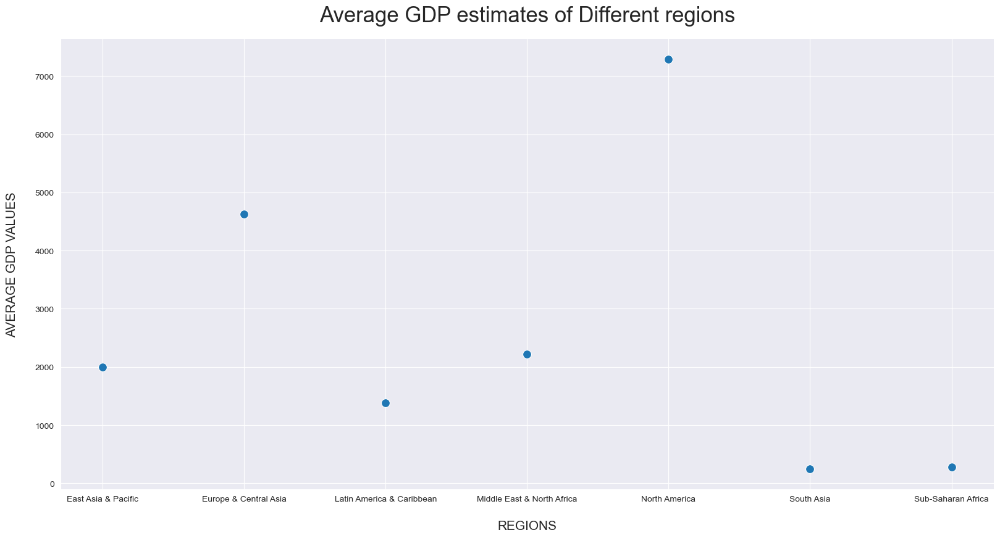

In [23]:
# sns.set_theme()
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_region,
            x="region_name",
            y="gdp_value", 
#             hue="region_name",
            height=8, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates of Different regions', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("REGIONS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

### Average GDP by Indicators

In [24]:
df_dim_indicator

,indicator_id,indicator_code,indicator_name,source_note,source_organization
0,1,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
1,2,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na..."
2,3,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
3,4,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na..."
4,5,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."


In [25]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_indicator,on='indicator_id')
# merged_df
average_gdp_by_indicators = merged_df.groupby('indicator_name')['gdp_value'].mean()
# print(average_gdp_by_indicators)
average_gdp_by_indicators = average_gdp_by_indicators.to_frame()
average_gdp_by_indicators

,gdp_value
indicator_name,
GDP growth (annual %),3.681001
GDP per capita (current US$),8396.011888
GDP per capita growth (annual %),1.959340
Gross savings (% of GDP),22.696665
"Inflation, GDP deflator (annual %)",25.018690


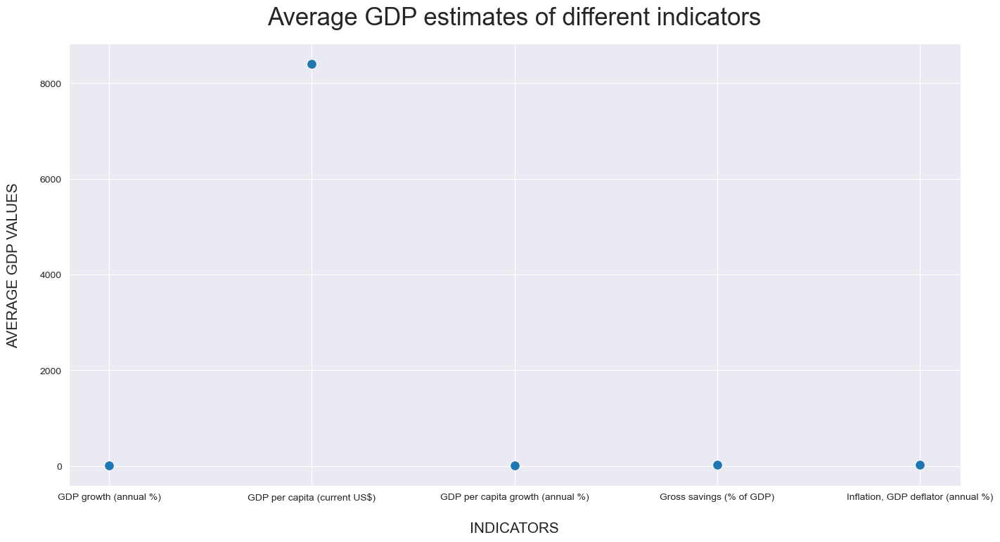

In [26]:
# sns.set_theme()
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_indicators,
            x="indicator_name",
            y="gdp_value", 
#             hue="region_name",
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates of different indicators', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("INDICATORS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

In [27]:
average_gdp_by_indicators_new = average_gdp_by_indicators.drop('GDP per capita (current US$)')
average_gdp_by_indicators_new

,gdp_value
indicator_name,
GDP growth (annual %),3.681001
GDP per capita growth (annual %),1.959340
Gross savings (% of GDP),22.696665
"Inflation, GDP deflator (annual %)",25.018690


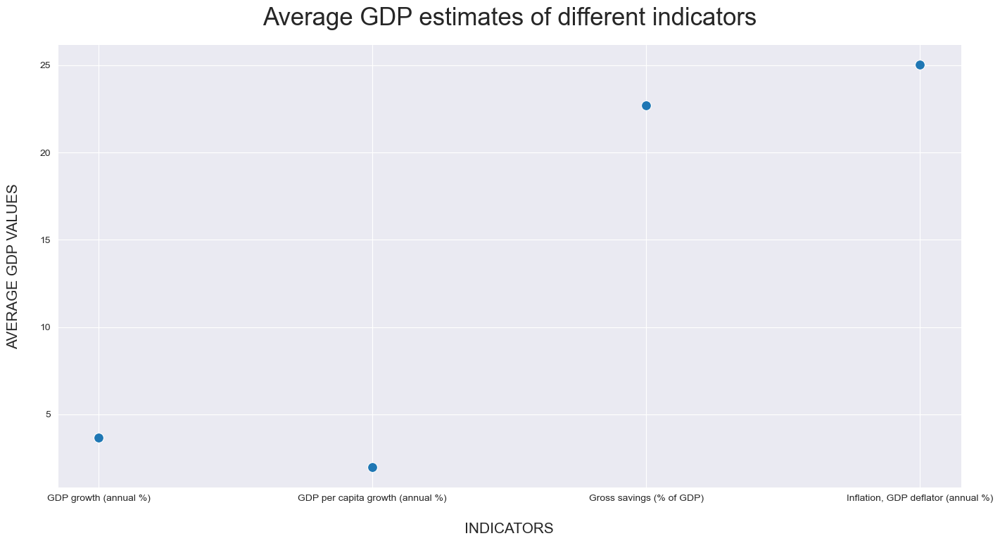

In [28]:
# sns.set_theme()
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_indicators_new,
            x="indicator_name",
            y="gdp_value", 
#             hue="region_name",
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates of different indicators', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("INDICATORS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

<hr>

### Average GDP by Income Groups

In [29]:
df_dim_income

,income_id,income_group
0,1,High income
1,2,Low income
2,3,Lower middle income
3,4,Upper middle income


In [30]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_income,on='income_id')
# merged_df
average_gdp_by_income = merged_df.groupby('income_group')['gdp_value'].mean()
# print(average_gdp_by_indicators)
average_gdp_by_income = average_gdp_by_income.to_frame()
average_gdp_by_income

,gdp_value
income_group,
High income,5172.815277
Low income,123.583152
Lower middle income,275.708669
Upper middle income,793.257564


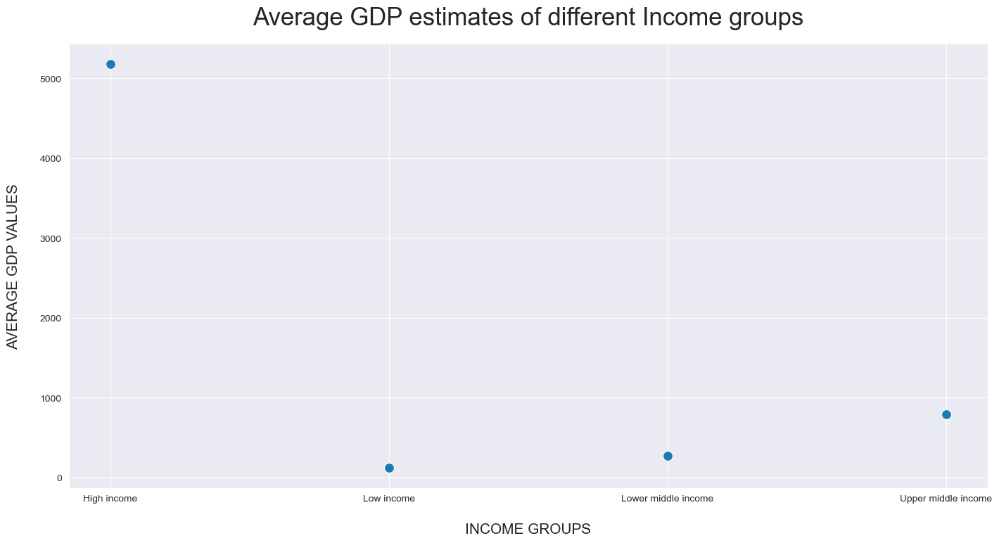

In [31]:
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_income,
            x="income_group",
            y="gdp_value", 
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates of different Income groups', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("INCOME GROUPS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

### Average GDP by Time period

In [32]:
df_dim_time_period

,time_period_id,year_
0,1,1960
1,2,1961
2,3,1962
3,4,1963
4,5,1964
...,...,...
58,59,2018
59,60,2019
60,61,2020
61,62,2021


In [33]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_time_period,left_on='year_id',right_on='time_period_id')
# merged_df
average_gdp_by_years = merged_df.groupby('year_')['gdp_value'].mean()
# print(average_gdp_by_indicators)
average_gdp_by_years = average_gdp_by_years.to_frame()
average_gdp_by_years

,gdp_value
year_,
1960,3.157895
1961,137.051075
1962,141.721242
1963,150.485421
1964,163.781017
...,...
2018,3662.191055
2019,3656.909330
2020,3416.411580


#### 1. Average GDP estimates over the period of 1960-2022

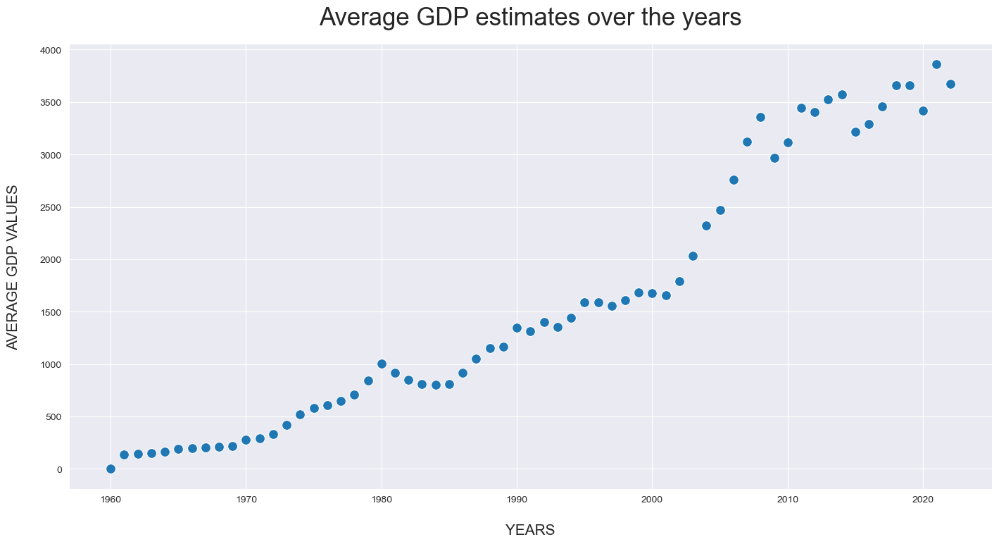

In [34]:
sns.set_style("darkgrid")
sns.relplot(data=average_gdp_by_years,
            x="year_",
            y="gdp_value", 
            height=7, 
            aspect=2, 
            s=100 # Increase marker size 
           )
plt.title('Average GDP estimates over the years', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("YEARS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

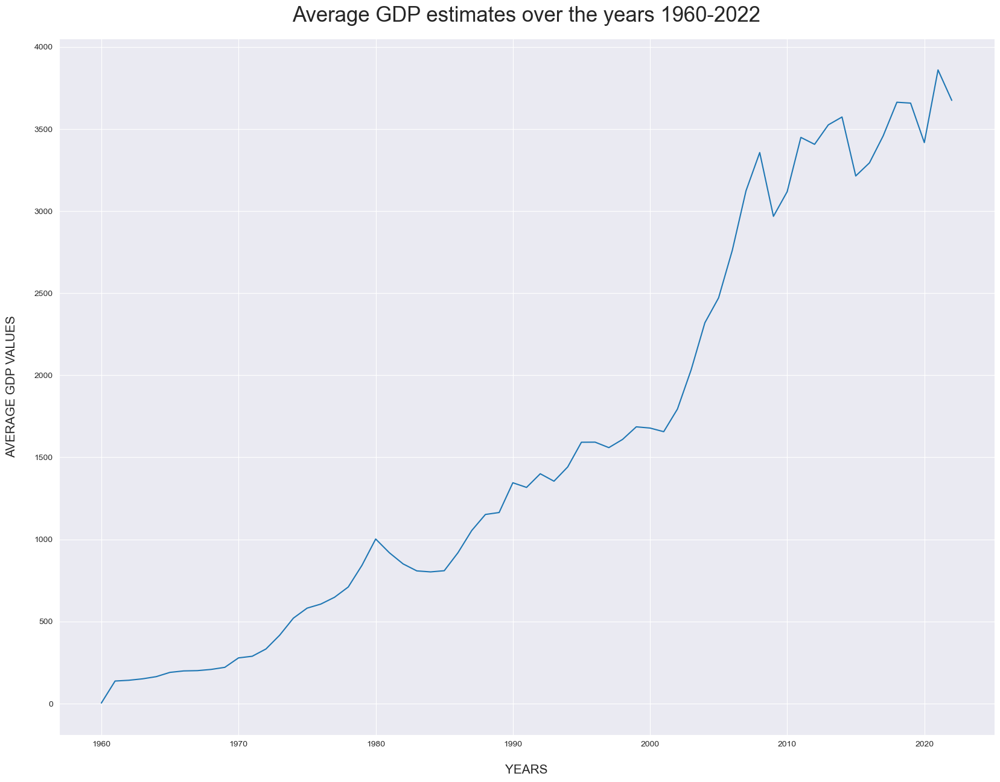

In [35]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=average_gdp_by_years,
             x="year_",
             y="gdp_value"
            )
plt.title('Average GDP estimates over the years 1960-2022', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("YEARS", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

#### 2. Average GDP estimates for each decade

In [36]:
average_gdp_by_years

,gdp_value
year_,
1960,3.157895
1961,137.051075
1962,141.721242
1963,150.485421
1964,163.781017
...,...
2018,3662.191055
2019,3656.909330
2020,3416.411580


In [37]:
def plot_averages(df):
    plt.figure(figsize=(17, 10))
#     lst = [str(i) for i in range(df.index[0],df.index[len(df)-1]+1)]
    sns.lineplot(data=df,
                 x="year_",
                 y="gdp_value",
                 marker='o',
                 markersize=10,
                 color='black',
                 markerfacecolor='red'
            )
#     .set_xticklabels(lst)
    plt.title(f'Average GDP estimates over the years {df.index[0]}-{df.index[len(df)-1]}', fontsize=25, pad=20)
    # plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(df.index)
    plt.show();

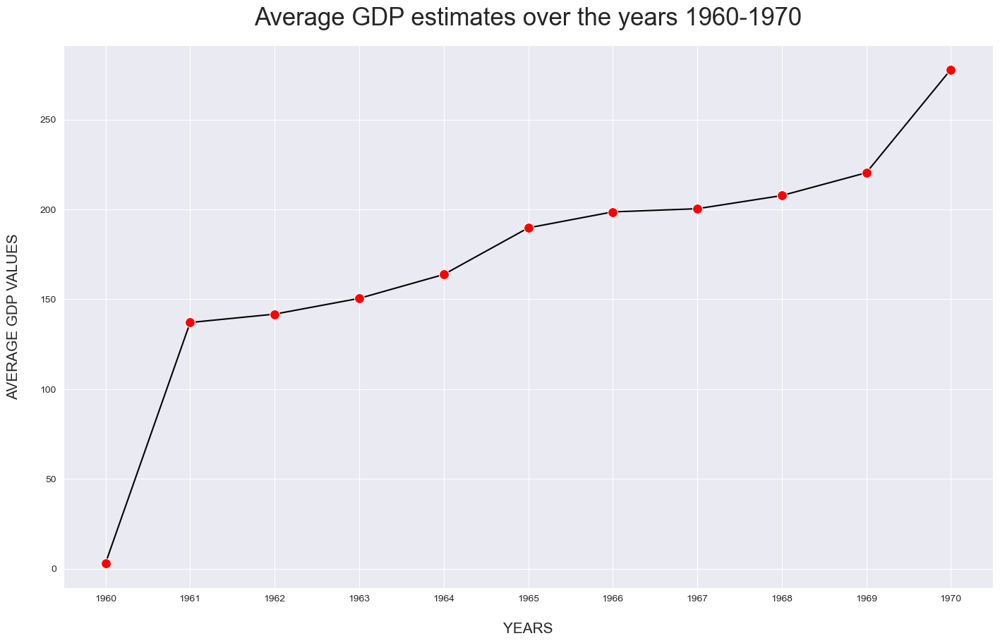

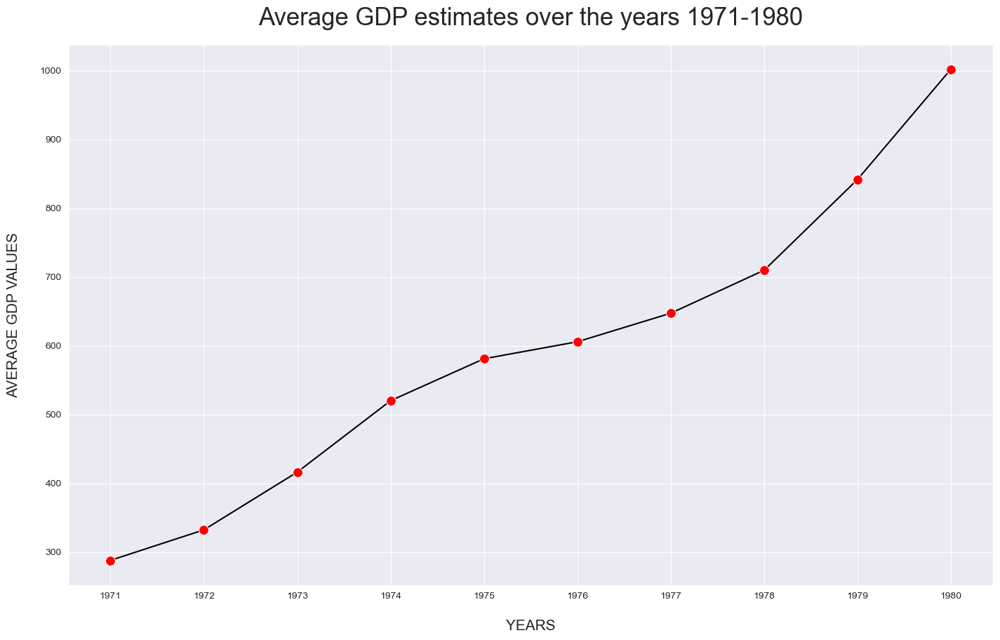

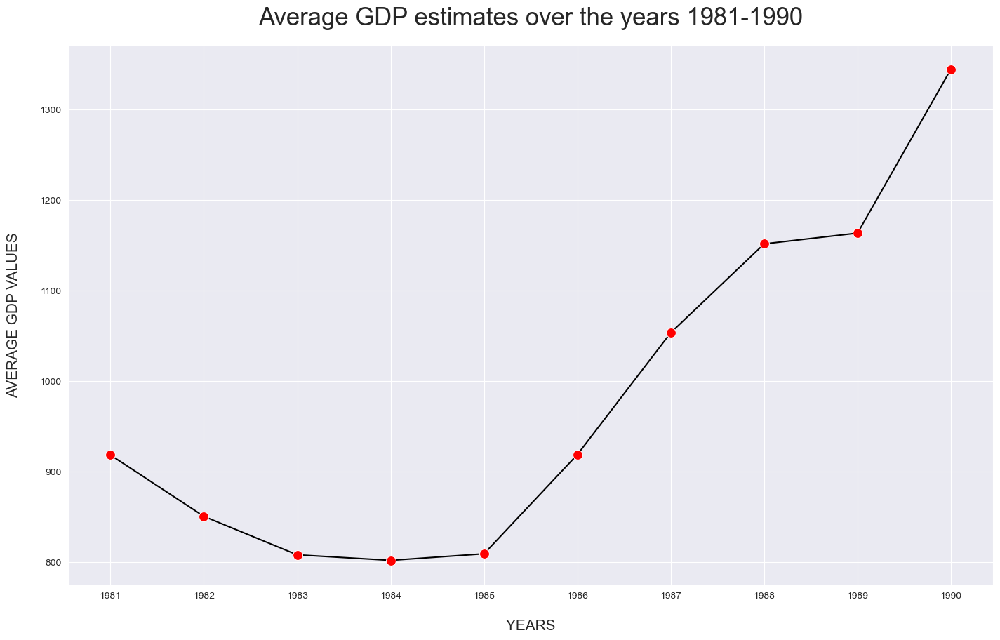

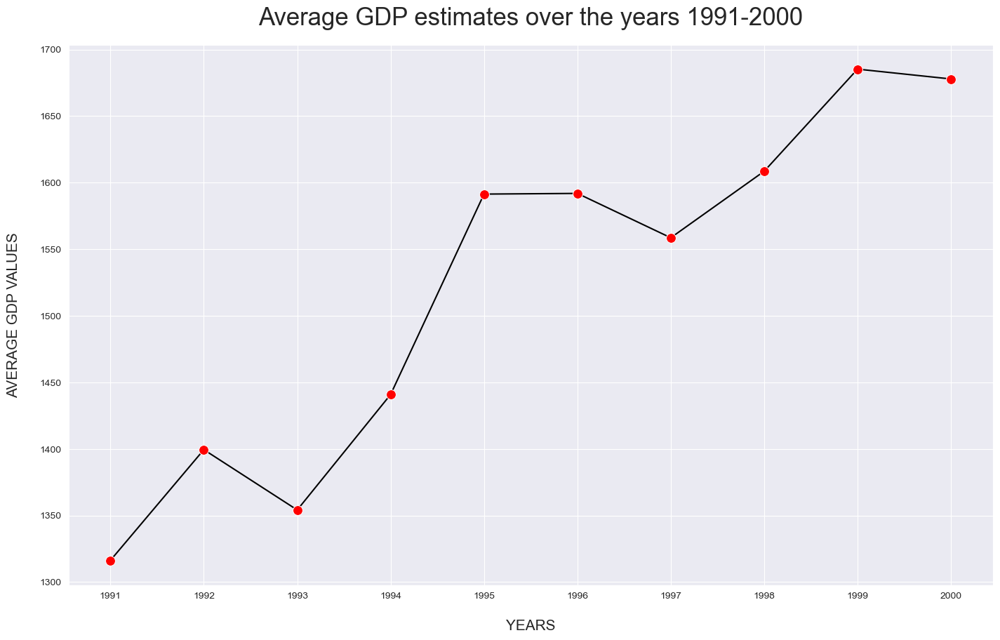

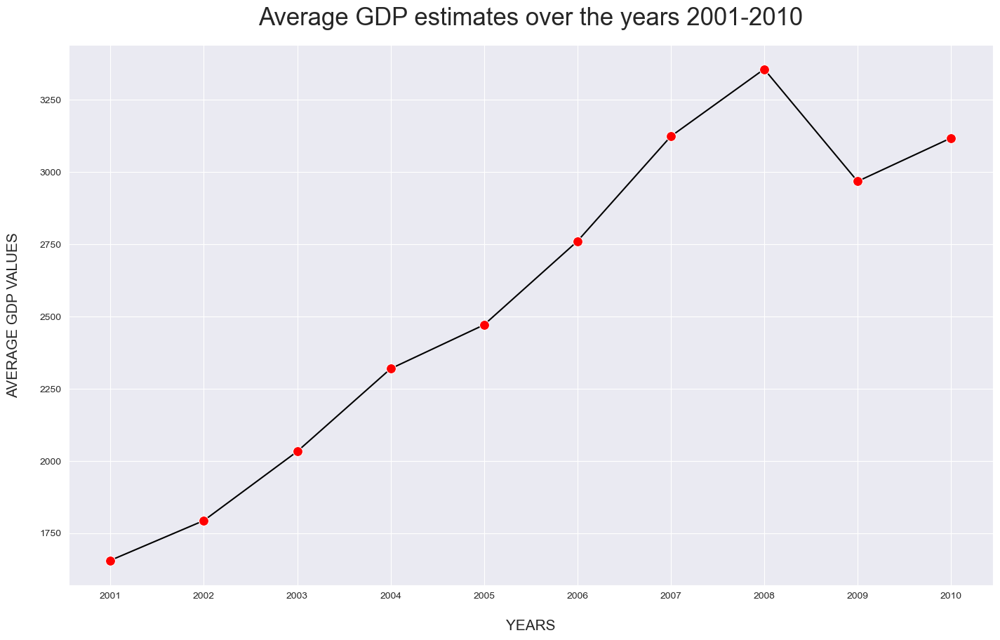

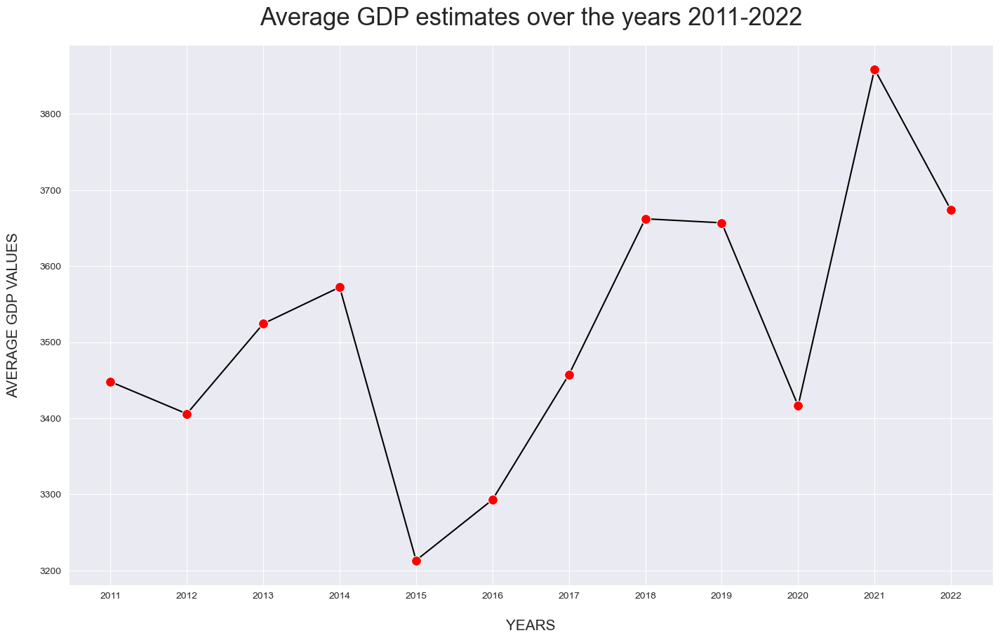

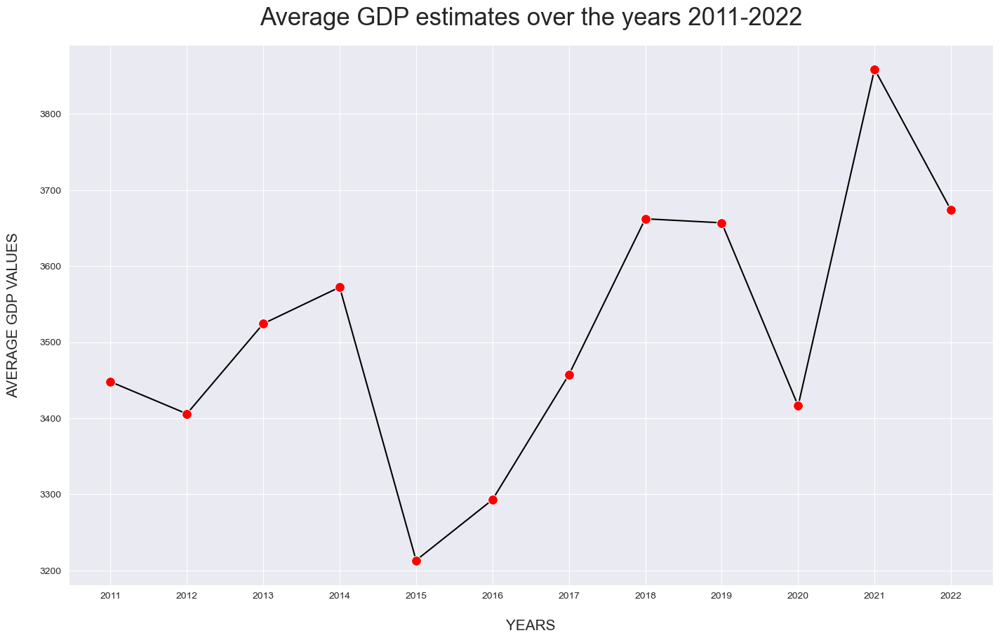

In [38]:
for i in range(0,len(average_gdp_by_years)+1,10):
    if i!=0 and i<50:
#         print(i+1,i+11)
        curr_df = average_gdp_by_years[i+1:i+11]
#         lst = [str(i) for i in range(curr_df.index[0],curr_df.index[len(curr_df)-1]+1)]
#         print(lst)
    
    elif i!=0 and i>50:
        pass
    elif i!=0:
#         print(i+1, len(average_gdp_by_years)) #end
        curr_df = average_gdp_by_years[i+1:len(average_gdp_by_years)]
    else:
#         print(i,i+11)
        curr_df = average_gdp_by_years[i:i+11]
    plot_averages(curr_df)
    

### Decade of growth

### COVID Period

# Average GDP by Countries

In [105]:
df_dim_country

,country_id,country_code,country_name,special_notes,region_id,income_id
0,1,ABW,Aruba,None,3.0,1.0
1,2,AFE,Africa Eastern and Southern,"26 countries, stretching from the Red Sea in t...",NaN,NaN
2,3,AFG,Afghanistan,The reporting period for national accounts dat...,6.0,2.0
3,4,AFW,Africa Western and Central,"22 countries, stretching from the westernmost ...",NaN,NaN
4,5,AGO,Angola,The World Bank systematically assesses the app...,7.0,3.0
...,...,...,...,...,...,...
260,261,XKX,Kosovo,None,2.0,4.0
261,262,YEM,"Yemen, Rep.",The World Bank systematically assesses the app...,4.0,2.0
262,263,ZAF,South Africa,Fiscal year end: March 31; reporting period fo...,7.0,4.0
263,264,ZMB,Zambia,National accounts data were rebased to reflect...,7.0,3.0


In [106]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
average_gdp_by_countries = merged_df.groupby('country_code')['gdp_value'].mean()
average_gdp_by_countries = average_gdp_by_countries.to_frame()
average_gdp_by_countries

,gdp_value
country_code,
ABW,4596.847125
AFE,190.384892
AFG,129.049165
AFW,182.625726
AGO,455.306737
...,...
XKX,818.488919
YEM,217.675467
ZAF,723.728259


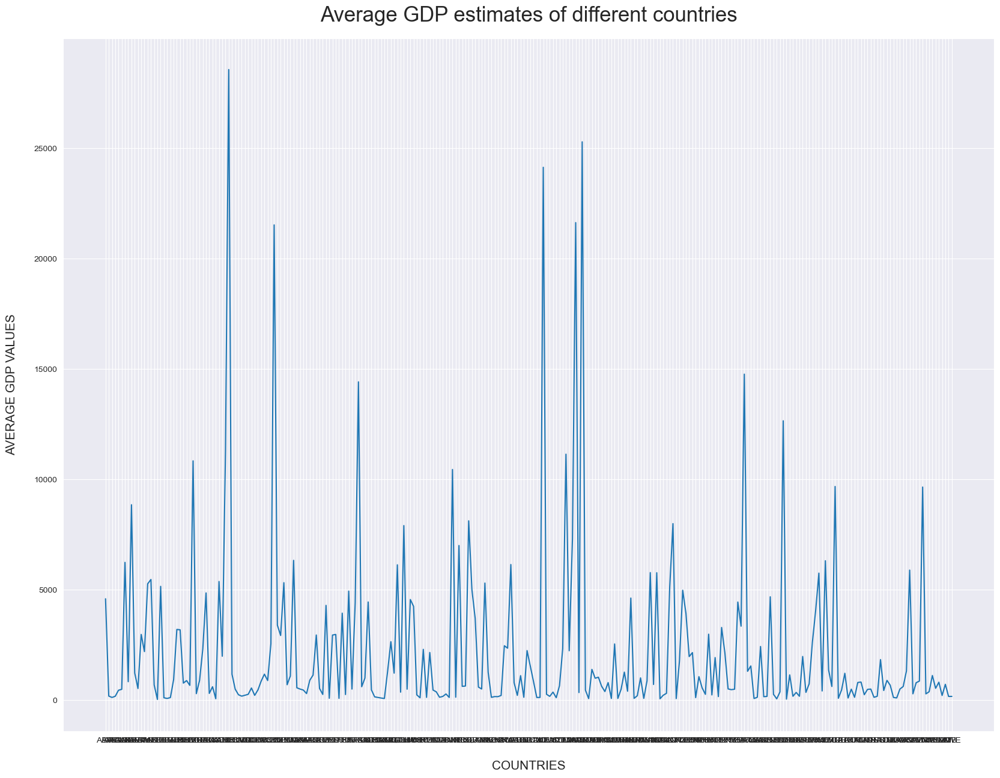

In [107]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=average_gdp_by_countries,
             x="country_code",
             y="gdp_value",
            )
plt.title('Average GDP estimates of different countries', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

#### Include regions

In [108]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name']],on='country_id')
# merged_df = pd.merge(merged_df,df_dim_regions,on='region_id')
merged_df

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name
0,1,1,28,3.0,1.0,1,3.591970,ABW,Aruba
1,2,1,29,3.0,1.0,1,3.108439,ABW,Aruba
2,3,1,30,3.0,1.0,1,3.962543,ABW,Aruba
3,4,1,31,3.0,1.0,1,5.769870,ABW,Aruba
4,5,1,32,3.0,1.0,1,5.614860,ABW,Aruba
...,...,...,...,...,...,...,...,...,...
59069,59072,5,59,7.0,3.0,265,13.923906,ZWE,Zimbabwe
59070,59073,5,60,7.0,3.0,265,20.231198,ZWE,Zimbabwe
59071,59074,5,61,7.0,3.0,265,16.452763,ZWE,Zimbabwe
59072,32848,3,52,3.0,1.0,147,21344.590320,MAF,St. Martin (French part)


In [109]:
average_gdp_by_countries = merged_df.groupby(['country_code','region_id'])['gdp_value'].mean()
average_gdp_by_countries = average_gdp_by_countries.to_frame()
average_gdp_by_countries
# pd.merge(average_gdp_by_countries,df_dim_regions,on='region_id')

,,gdp_value
country_code,region_id,
ABW,3.0,4596.847125
AFG,6.0,129.049165
AGO,7.0,455.306737
ALB,2.0,496.685546
AND,2.0,6245.746607
...,...,...
XKX,2.0,818.488919
YEM,4.0,217.675467
ZAF,7.0,723.728259


In [110]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name']],on='country_id')
# merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name']],on='country_id')
# merged_df
average_gdp_by_countries = merged_df.groupby(['country_code'])['gdp_value'].mean()
average_gdp_by_countries = average_gdp_by_countries.to_frame()
average_gdp_by_countries['country_code'] = average_gdp_by_countries.index
average_gdp_by_countries = average_gdp_by_countries.reset_index(drop=True)
# average_gdp_by_countries['country_name'] = pd

In [111]:
average_gdp_by_countries

,gdp_value,country_code
0,4596.847125,ABW
1,190.384892,AFE
2,129.049165,AFG
3,182.625726,AFW
4,455.306737,AGO
...,...,...
257,818.488919,XKX
258,217.675467,YEM
259,723.728259,ZAF
260,173.633306,ZMB


In [112]:
average_gdp_by_countries = pd.merge(average_gdp_by_countries,df_dim_country[['country_code','country_id','country_name','region_id']],on='country_code')
# average_gdp_by_countries = pd.merge(average_gdp_by_countries,df_dim_regions,on='region_id')
average_gdp_by_countries

,gdp_value,country_code,country_id,country_name,region_id
0,4596.847125,ABW,1,Aruba,3.0
1,190.384892,AFE,2,Africa Eastern and Southern,NaN
2,129.049165,AFG,3,Afghanistan,6.0
3,182.625726,AFW,4,Africa Western and Central,NaN
4,455.306737,AGO,5,Angola,7.0
...,...,...,...,...,...
257,818.488919,XKX,261,Kosovo,2.0
258,217.675467,YEM,262,"Yemen, Rep.",4.0
259,723.728259,ZAF,263,South Africa,7.0
260,173.633306,ZMB,264,Zambia,7.0


In [113]:
average_gdp_by_countries = pd.merge(average_gdp_by_countries,df_dim_regions,on='region_id')
average_gdp_by_countries

,gdp_value,country_code,country_id,country_name,region_id,region_name
0,4596.847125,ABW,1,Aruba,3.0,Latin America & Caribbean
1,1238.866011,ARG,10,Argentina,3.0,Latin America & Caribbean
2,2206.209989,ATG,13,Antigua and Barbuda,3.0,Latin America & Caribbean
3,3192.218291,BHS,24,"Bahamas, The",3.0,Latin America & Caribbean
4,675.322216,BLZ,27,Belize,3.0,Latin America & Caribbean
...,...,...,...,...,...,...
209,387.457028,VUT,258,Vanuatu,1.0,East Asia & Pacific
210,543.106523,WSM,260,Samoa,1.0,East Asia & Pacific
211,10843.049702,BMU,28,Bermuda,5.0,North America
212,5380.265005,CAN,36,Canada,5.0,North America


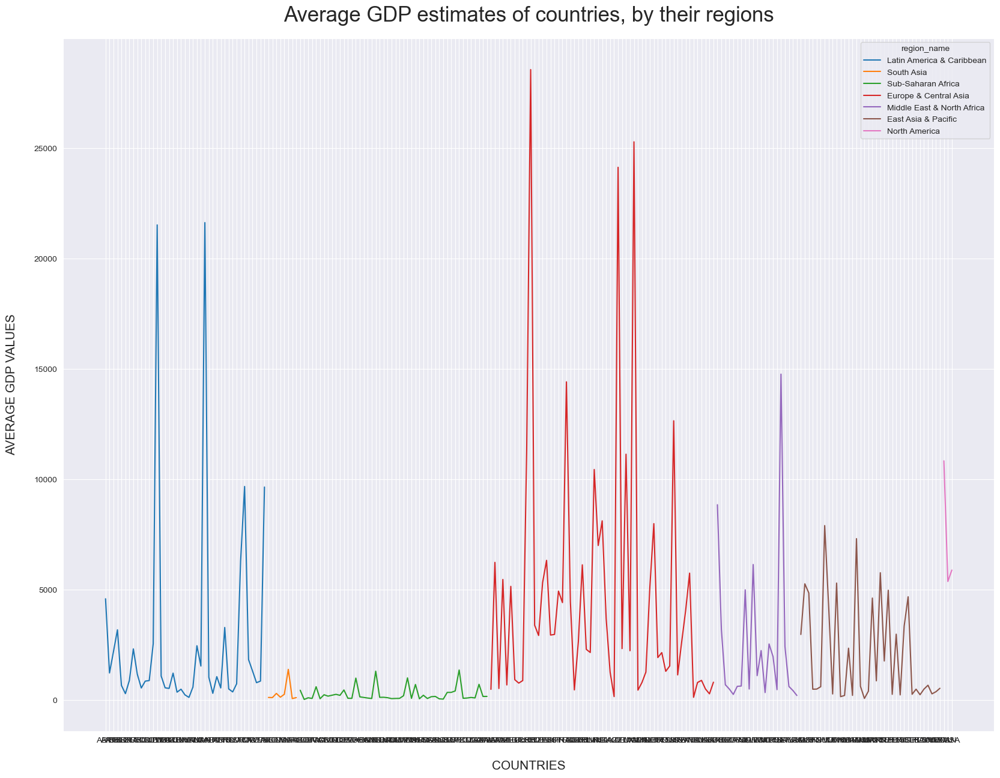

In [114]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=average_gdp_by_countries,
             x="country_code",
             y="gdp_value",
             hue="region_name"
            )
plt.title('Average GDP estimates of countries, by their regions', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

# Top 10

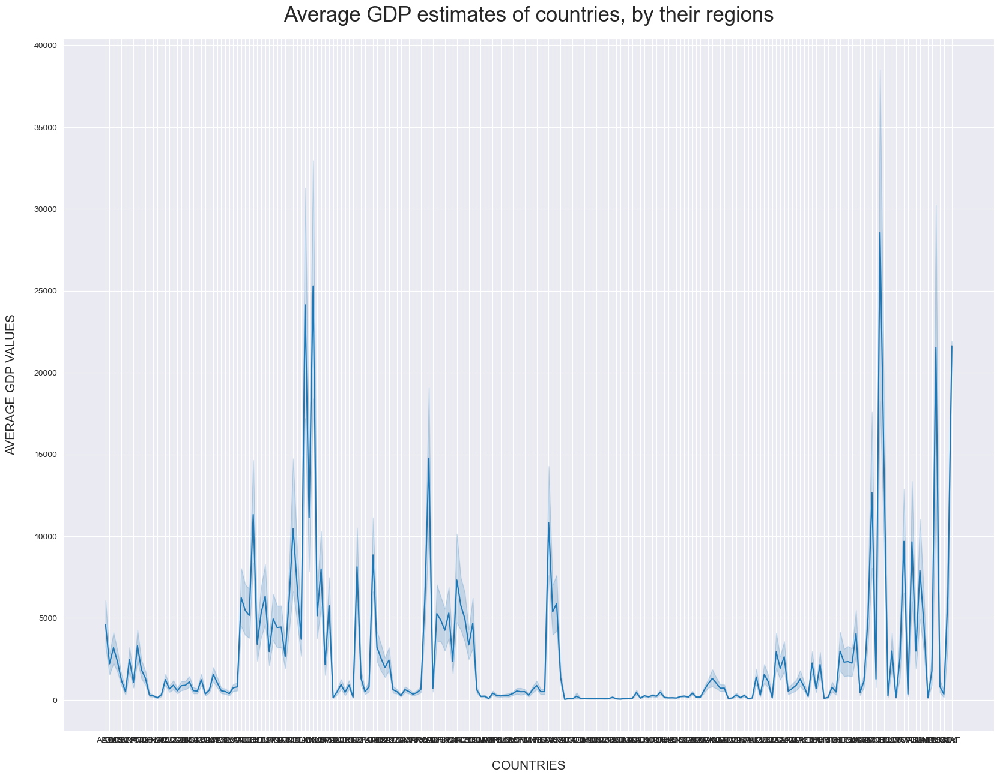

In [162]:
plt.figure(figsize=(20, 15))
sns.lineplot(data=df,
             x="country_code",
             y="gdp_value"
            )
plt.title('Average GDP estimates of countries, by their regions', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("AVERAGE GDP VALUES", fontsize=15, labelpad=20)
plt.show();

In [145]:
df = pd.merge(df_fact,
        df_dim_country[['country_id','country_code','country_name']],
        on='country_id')

In [146]:
df = pd.merge(df,
        df_dim_income,
        on='income_id')

In [147]:
df = pd.merge(df,
        df_dim_indicator,
        on='indicator_id')

In [149]:
df = pd.merge(df,
        df_dim_regions,
        on='region_id')

In [150]:
df = pd.merge(df,
        df_dim_time_period,
        left_on='year_id',right_on='time_period_id')
df = df.drop(columns=['time_period_id'])

In [152]:
# df

In [158]:
df_top_10 = df.sort_values(by=['gdp_value'], ascending=False)

In [160]:
df_top_10 = df_top_10[0:10:1]

In [161]:
df_top_10

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
31275,32964,3,62,2.0,1.0,149,234317.0848,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
18384,32951,3,49,2.0,1.0,149,204097.2100,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2008
29307,32962,3,60,2.0,1.0,149,199382.7812,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2019
24313,32957,3,55,2.0,1.0,149,195772.6730,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014
28311,32961,3,59,2.0,1.0,149,194287.0933,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2018
23321,32956,3,54,2.0,1.0,149,185055.4874,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2013
17414,32950,3,48,2.0,1.0,149,184626.7292,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2007
31271,32372,3,62,2.0,1.0,137,184083.3214,LIE,Liechtenstein,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
30299,32963,3,61,2.0,1.0,149,182537.3046,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2020
24309,32365,3,55,2.0,1.0,137,179467.5069,LIE,Liechtenstein,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014


### Top 10 GDP performances

In [168]:
df_top_10

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
31275,32964,3,62,2.0,1.0,149,234317.0848,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
18384,32951,3,49,2.0,1.0,149,204097.2100,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2008
29307,32962,3,60,2.0,1.0,149,199382.7812,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2019
24313,32957,3,55,2.0,1.0,149,195772.6730,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014
28311,32961,3,59,2.0,1.0,149,194287.0933,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2018
23321,32956,3,54,2.0,1.0,149,185055.4874,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2013
17414,32950,3,48,2.0,1.0,149,184626.7292,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2007
31271,32372,3,62,2.0,1.0,137,184083.3214,LIE,Liechtenstein,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
30299,32963,3,61,2.0,1.0,149,182537.3046,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2020
24309,32365,3,55,2.0,1.0,137,179467.5069,LIE,Liechtenstein,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014


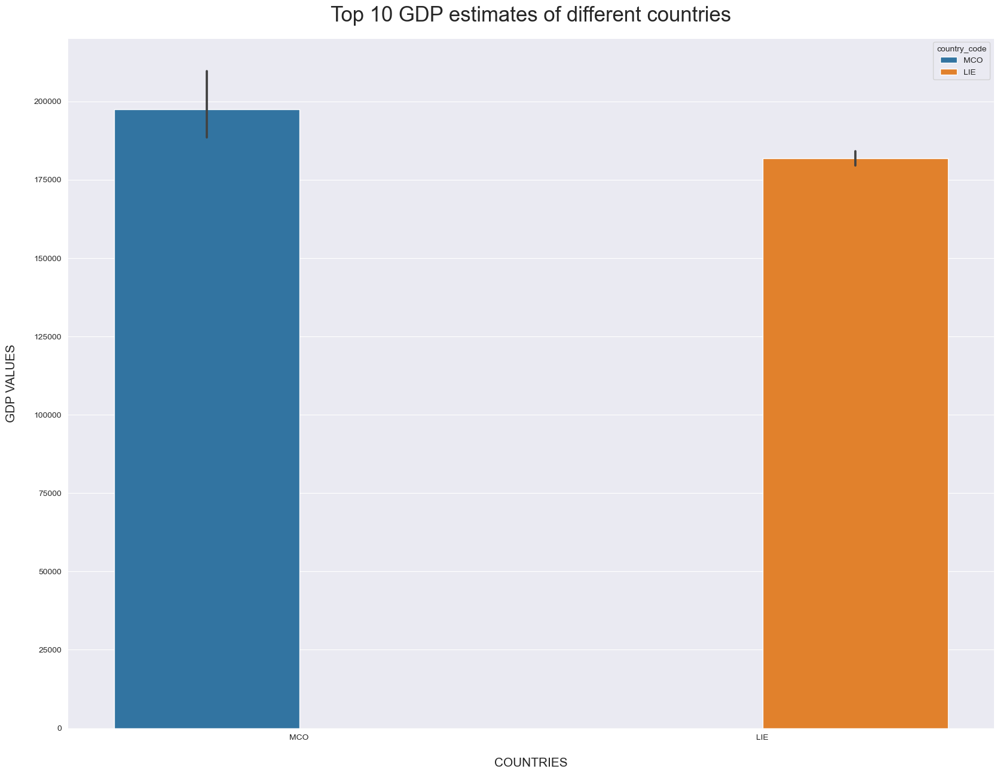

In [179]:
plt.figure(figsize=(20, 15))
sns.barplot(data=df_top_10,
             x="country_code",
             y="gdp_value",
            hue = "country_code"
            )
plt.title('Top 10 GDP estimates of different countries', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
plt.show();

GDP-wise for better viewability

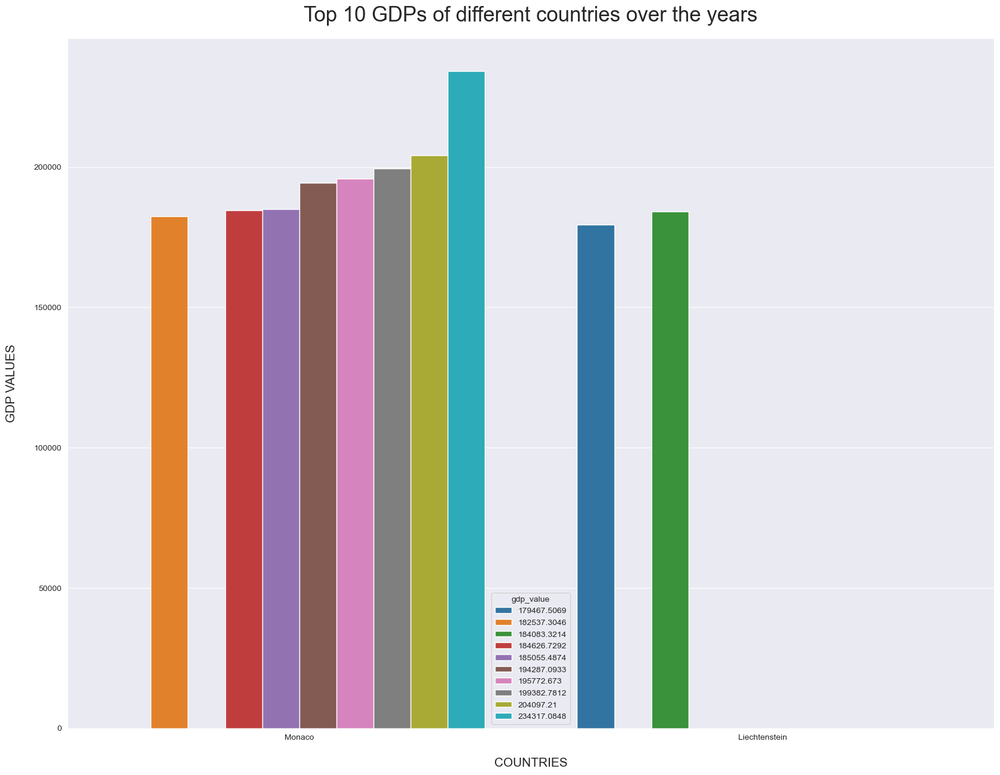

In [180]:
plt.figure(figsize=(20, 15))
sns.color_palette("mako", as_cmap=True)
sns.barplot(data=df_top_10,
             x="country_name",
             y="gdp_value",
            hue = "gdp_value"
            )
plt.title('Top 10 GDPs of different countries over the years', fontsize=25, pad=20)
# plt.title('AVERAGE GDP VALUES OF DIFFERENT REGIONS', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
plt.show();

### Top 10 Countries (based in individual GDP over 1960-2022)

In [182]:
df_sorted = df.sort_values(by=['gdp_value'], ascending=False)

In [186]:
df_sorted.groupby(['country_code'])['gdp_value'].max()

country_code
ABW    31902.762580
AFG      663.141053
AGO     5101.983876
ALB     6802.804519
AND    53721.411330
           ...     
XKX     5351.439542
YEM     1557.601406
ZAF     8737.041110
ZMB     1840.320553
ZWE     2269.177012
Name: gdp_value, Length: 213, dtype: float64

In [188]:
df_sorted

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
31275,32964,3,62,2.0,1.0,149,234317.084800,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2021
18384,32951,3,49,2.0,1.0,149,204097.210000,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2008
29307,32962,3,60,2.0,1.0,149,199382.781200,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2019
24313,32957,3,55,2.0,1.0,149,195772.673000,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2014
28311,32961,3,59,2.0,1.0,149,194287.093300,MCO,Monaco,High income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",Europe & Central Asia,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33500,57583,5,21,1.0,3.0,209,-125.985178,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1980
35471,57586,5,24,1.0,3.0,209,-125.999407,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1983
36158,57587,5,25,1.0,3.0,209,-126.013827,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1984
34792,57585,5,23,1.0,3.0,209,-128.956792,SLB,Solomon Islands,Lower middle income,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na...",East Asia & Pacific,1982


In [197]:
df[df['country_code']=='AFG'].sort_values(by=['gdp_value'], ascending=False)

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,income_group,indicator_code,indicator_name,source_note,source_organization,region_name,year_
22981,25468,3,53,6.0,2.0,3,663.141053,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2012
23972,25469,3,54,6.0,2.0,3,651.987862,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2013
24973,25470,3,55,6.0,2.0,3,628.146804,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2014
21991,25467,3,52,6.0,2.0,3,621.912414,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2011
25974,25471,3,56,6.0,2.0,3,592.476165,AFG,Afghanistan,Low income,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na...",South Asia,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15171,38804,4,45,6.0,2.0,3,-2.497255,AFG,Afghanistan,Low income,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",South Asia,2004
21999,38811,4,52,6.0,2.0,3,-3.211364,AFG,Afghanistan,Low income,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",South Asia,2011
30954,38820,4,61,6.0,2.0,3,-5.364666,AFG,Afghanistan,Low income,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na...",South Asia,2020
31893,12721,2,62,6.0,2.0,3,-20.700000,AFG,Afghanistan,Low income,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na...",South Asia,2021


In [203]:
df_top_10_countries = df_sorted.groupby(
    ['country_code'])[['year_', 'gdp_value']].apply(lambda x: x.loc[x['gdp_value'].idxmax()])

df_top_10_countries = df_top_10_countries.sort_values(by=['gdp_value'],ascending=False)[0:10]
df_top_10_countries['country_code'] = df_top_10_countries.index
df_top_10_countries = df_top_10_countries.reset_index(drop=True)
df_top_10_countries

,year_,gdp_value,country_code
0,2021.0,234317.08480,MCO
1,2021.0,184083.32140,LIE
2,2021.0,133590.14700,LUX
3,2022.0,118845.62110,BMU
4,2022.0,106148.77860,NOR
5,2022.0,104038.94610,IRL
6,2012.0,98041.36224,QAT
7,2022.0,92101.46974,CHE
8,2014.0,91881.12836,IMN
9,2014.0,90873.60249,MAC


<h1 style="color:red;"> Do this Indicators wise </h1>

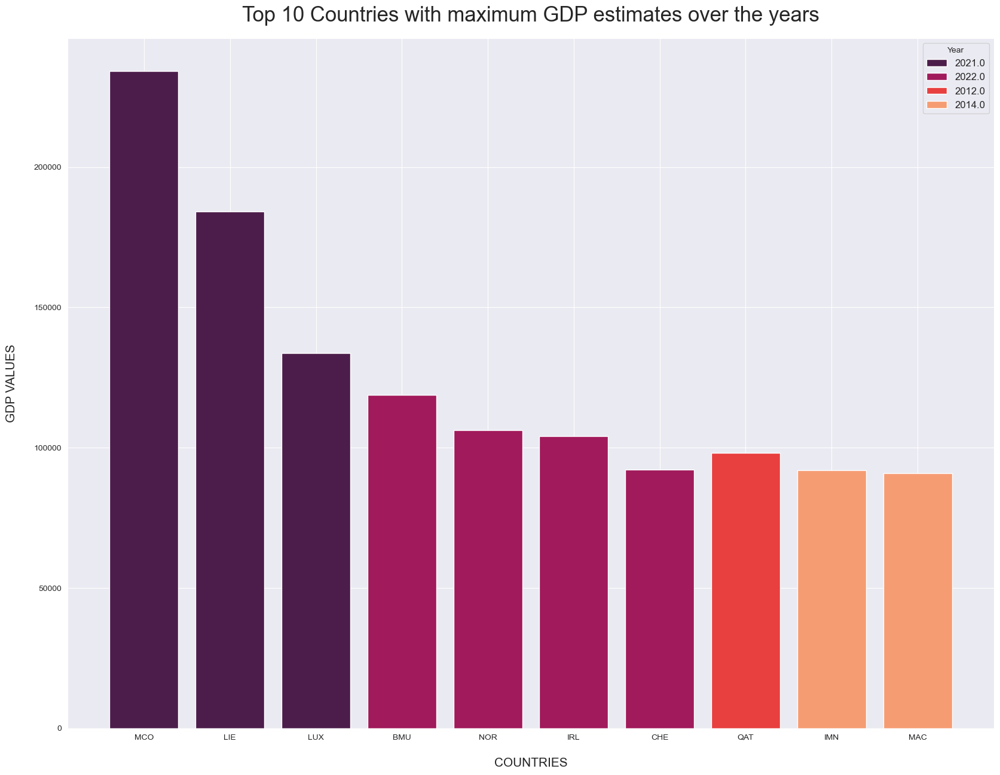

In [406]:
years = df_top_10_countries['year_'].unique().tolist()
colors = sns.color_palette("rocket", len(years))
color_dict = dict(zip(years, colors))
plt.figure(figsize=(20, 15))
for i, year in enumerate(years):
    year_data = df_top_10_countries[df_top_10_countries['year_'] == year]
    plt.bar(year_data['country_code'], year_data['gdp_value'], color=color_dict[year], label=year)
plt.legend(title='Year', fontsize=12)
plt.title('Top 10 Countries with maximum GDP estimates over the years', fontsize=25, pad=20)
plt.xlabel("COUNTRIES", fontsize=15, labelpad=20)
plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
plt.show()

<h1 style="color:red;">INCOMPLETE</h1>

### Yearly top Countries, Income groups & Regions with maximum GDP estimates for every indicator. Analyzed over each decade. [INCOMPLETE]

- Countries (done)
- Income groups (not done)
- Regions (not done)

In [388]:
def plot_maxgdps_years_decade_wise(s,start,end):
    #general plot of the decade
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=s,
                x='year',
                y='gdp_value',
                marker='o',
                color='black',
                markerfacecolor='red',
                markersize=10)
    plt.title(f'Maximum GDP estimates over the decade {s.year[start]}-{s.year[end]}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("MAX GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(s.year)
    plt.show();

    #country-wise
    plt.figure(figsize=(17, 10))
    sns.lineplot(data=s,
                x='year',
                y='gdp_value',
                hue='country_code',
                marker='o',
                markersize=10)
    plt.title(f'Maximum GDP estimates over the decade {s.year[start]}-{s.year[end]}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("MAX GDP VALUES", fontsize=15, labelpad=20)
    plt.xticks(s.year)
    plt.show();    
    
    print('\n\n')

In [403]:
def plot_general_graphs(i,df): #indicator, dataframe
    #BAR GRAPH
    plt.figure(figsize=(20, 15))
    sns.barplot(data=df,
                x="year",
                y="gdp_value",
                palette = sns.color_palette("rocket"),
               )
    plt.title(f'GDP estimates over the years 1960 - 2022 for Indicator {i}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();
    
    #LINE CHART
    plt.figure(figsize=(20, 15))
    sns.lineplot(data=df,
                x="year",
                y="gdp_value",
                color="black"
                )
    plt.title(f'GDP estimates over the years 1960 - 2022 for Indicator {i}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();
    
    #DECADE-WISE VISUALIZATION
    #if 1961 is the start
    if df.year[0] == 1961:
        for i in range(0,len(df)+1,10):
            if i!=0 and i<50:
                curr_df = df[i:i+10]        
                plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])

            elif i!=0 and i>50:
                continue
            elif i!=0:        
                curr_df = df[i:len(df)]
                plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])
            else:
                curr_df = df[i:i+10]
                plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])
    else:              
        for i in range(0,len(df)+1,10):
            if i!=0 and i<50:
                curr_df = df[i+1:i+11]
            elif i!=0 and i>50:
                continue
            elif i!=0:
                curr_df = df[i+1:len(df)]
            else:
                curr_df = df[i:i+11]
            plot_maxgdps_years_decade_wise(curr_df,curr_df.index[0],curr_df.index[len(curr_df)-1])    

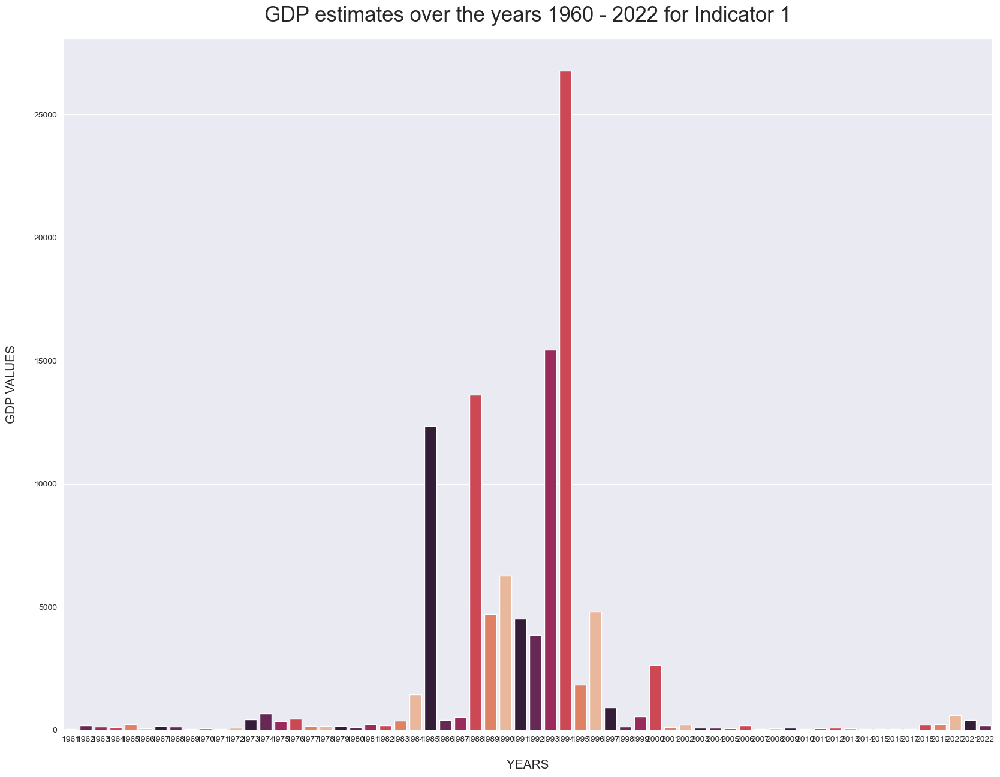

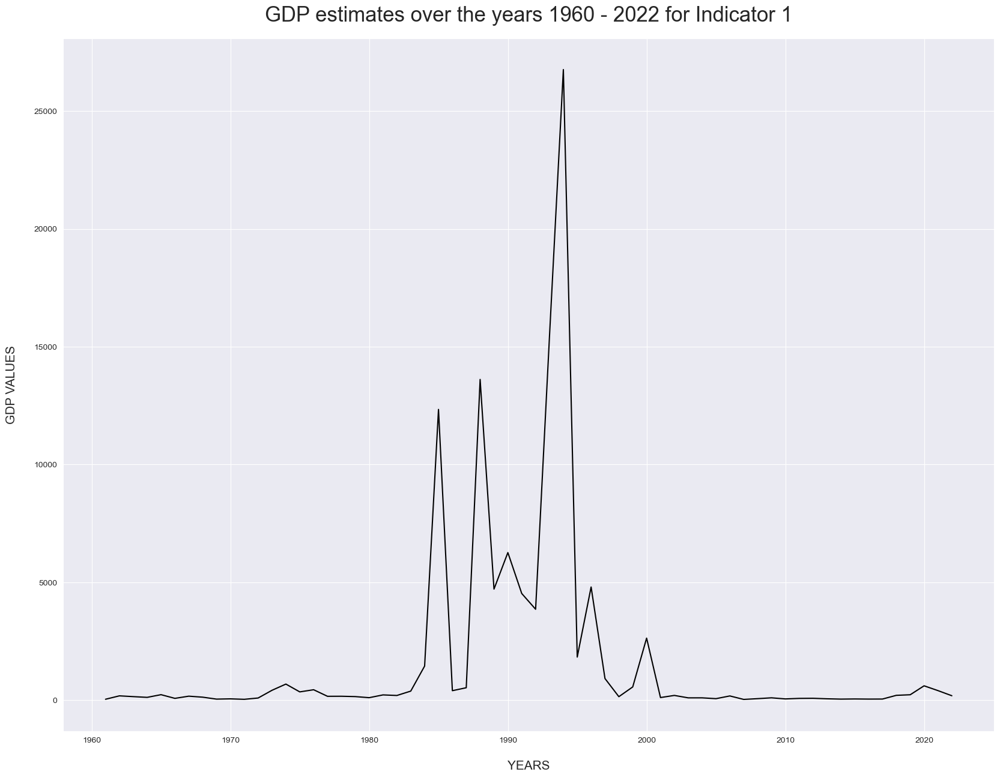

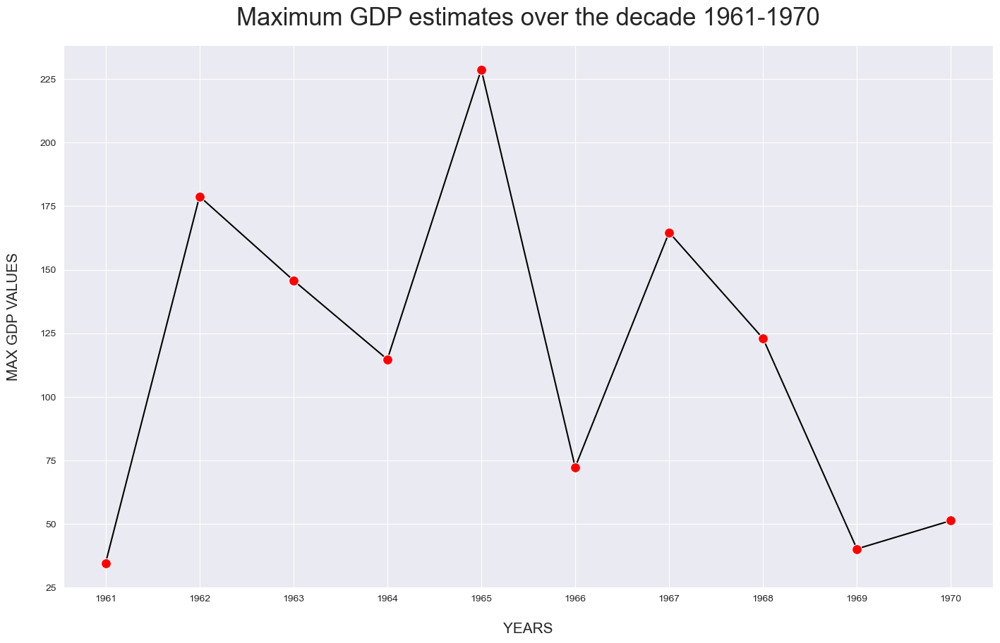

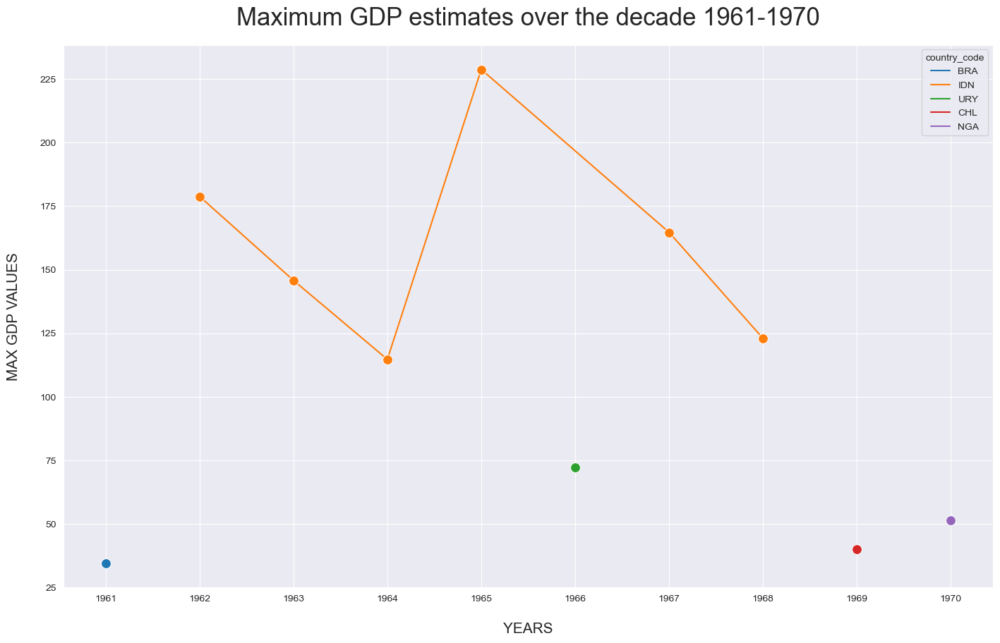

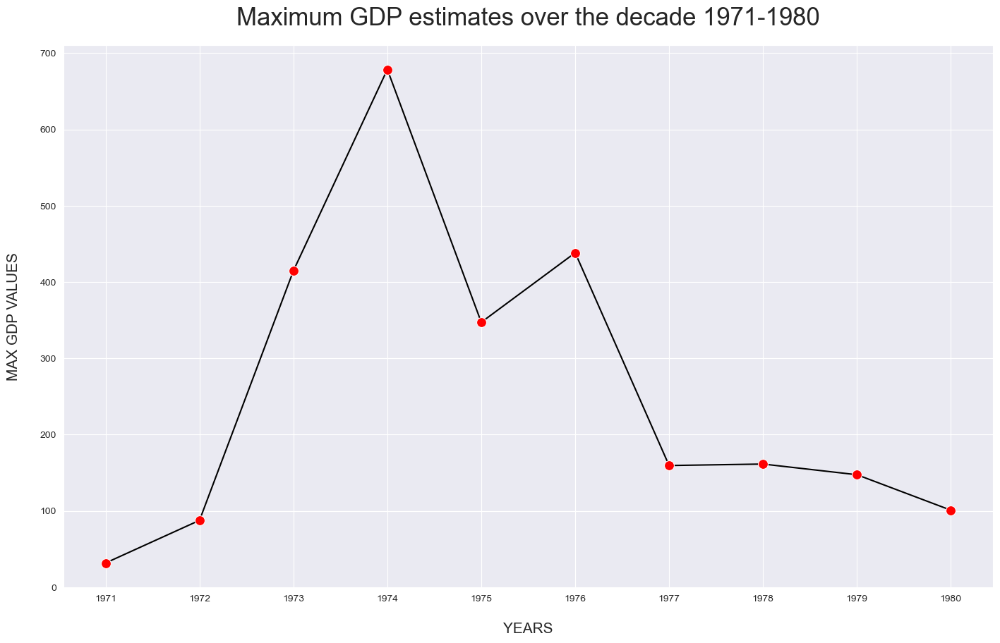

...

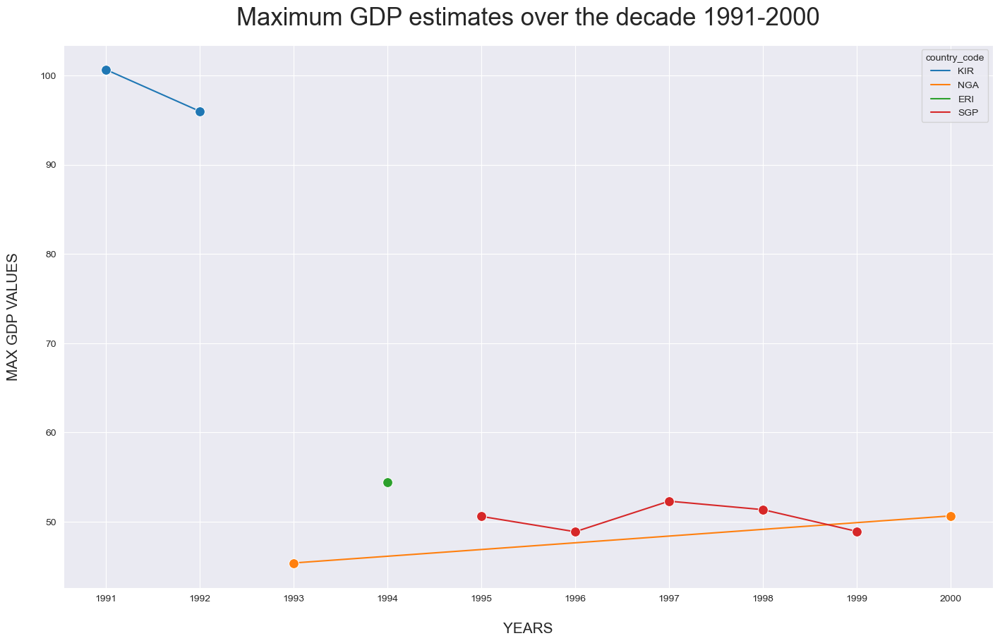

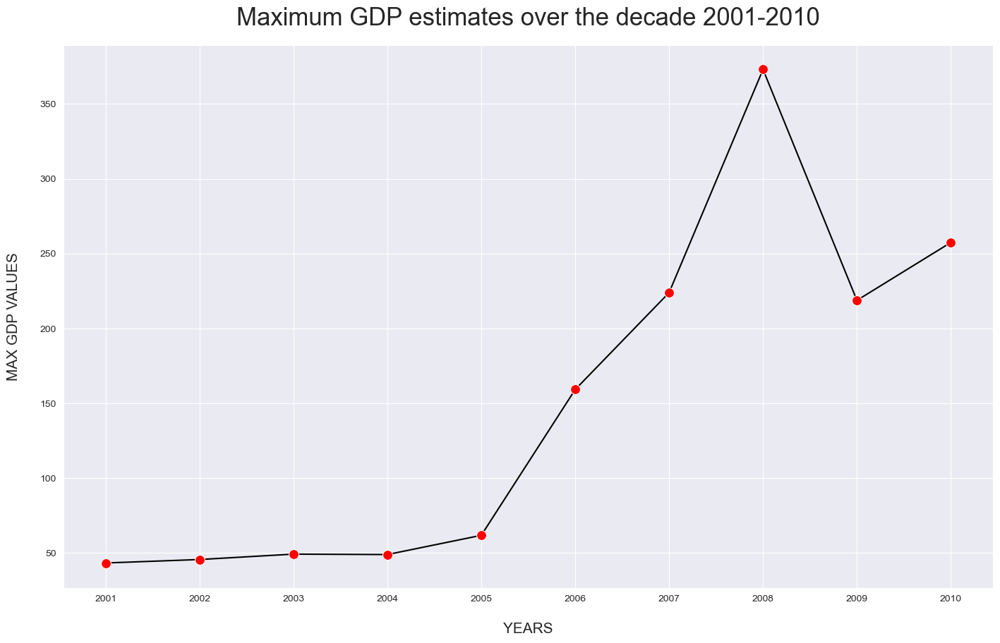

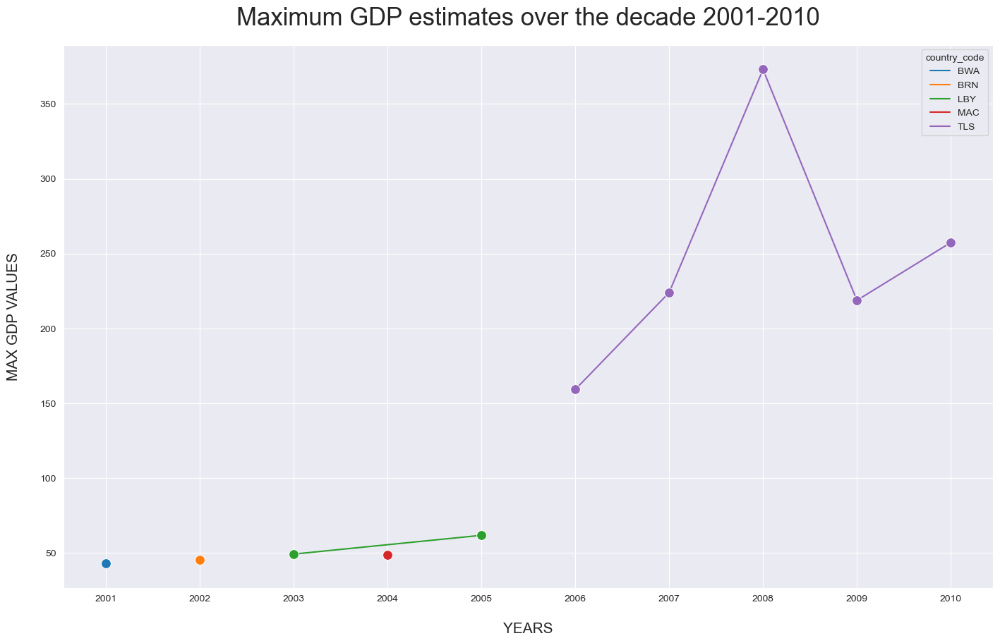

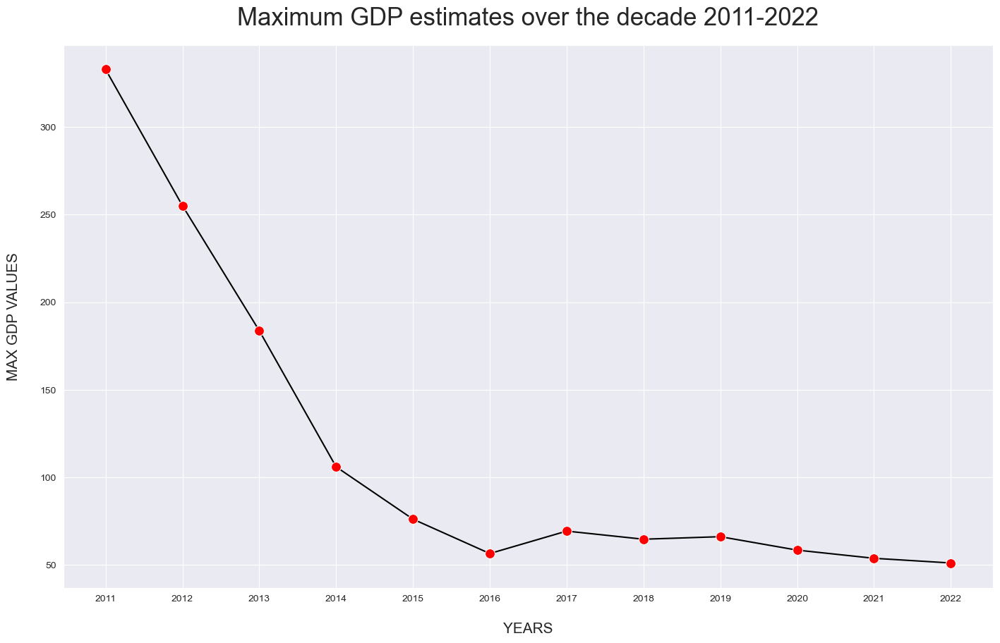

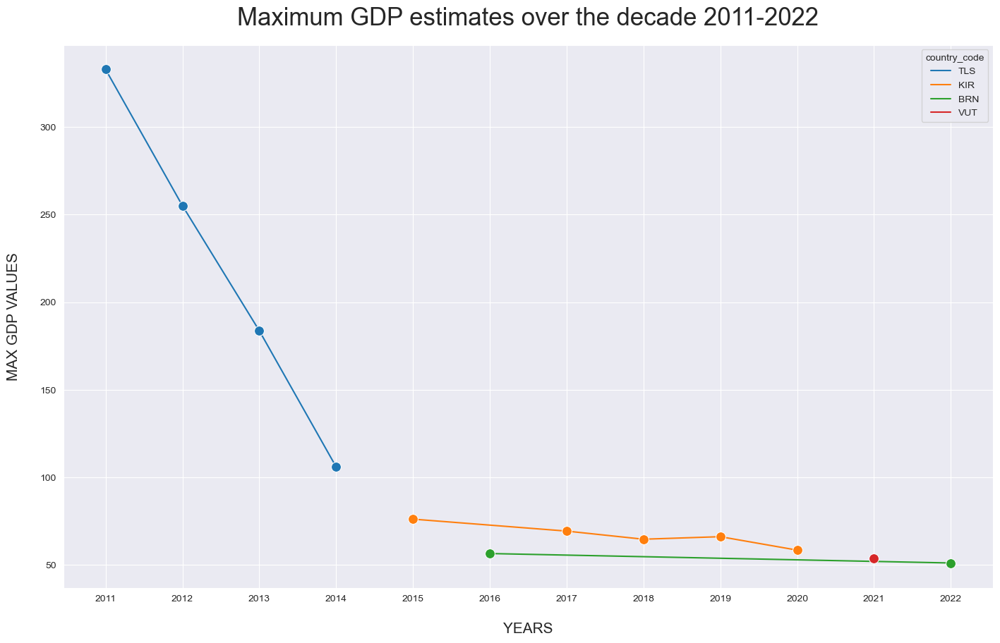

In [405]:
for i in range(1,6):
    # i = indicator
    df_indicator = df_sorted[df_sorted['indicator_id']==i]
    df_indicator = df_indicator.groupby(['year_'])[['gdp_value','country_code','country_name','income_group']].apply(lambda x: x.loc[x['gdp_value'].idxmax()])
    df_indicator['year'] = df_indicator.index
    df_indicator = df_indicator.reset_index(drop=True)
    plot_general_graphs(i,df_indicator)
    
    

<hr>

# Top 10 Years of performance (based in individual GDP over 1960-2022), for every Indicator

'Gross savings (% of GDP)'

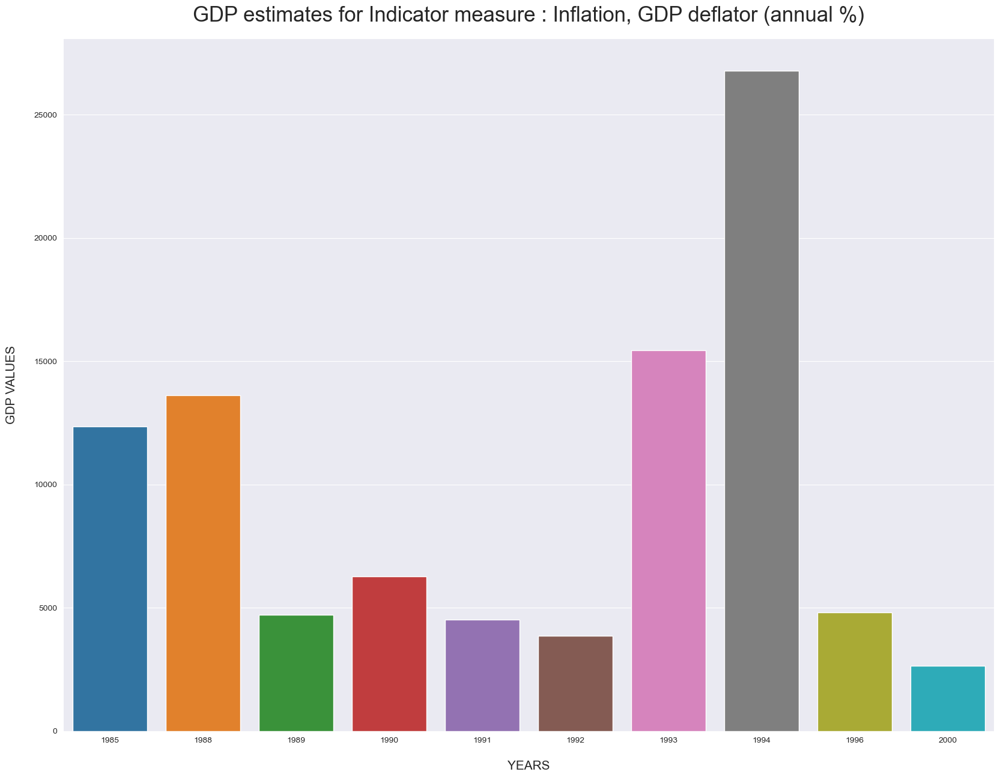

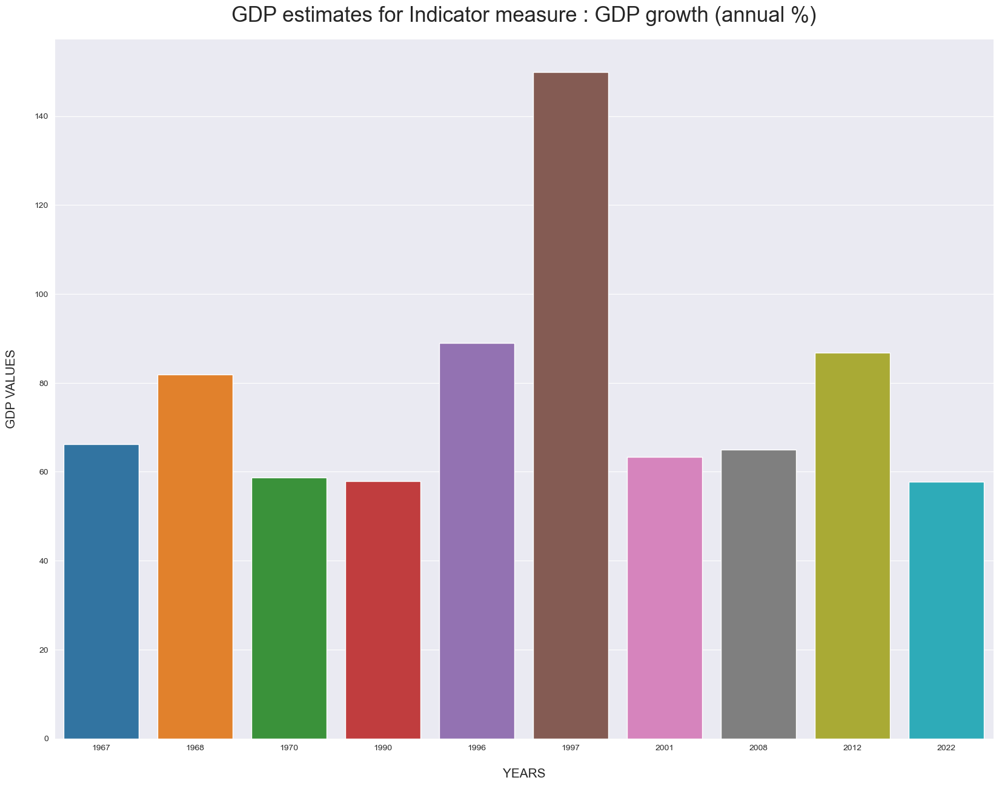

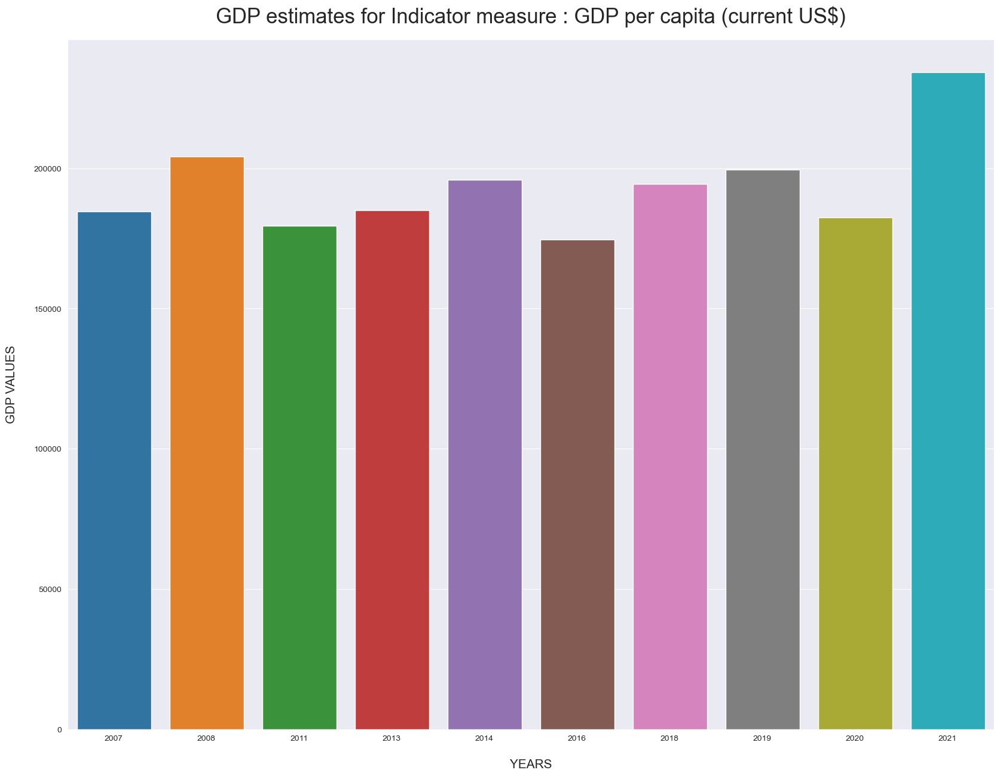

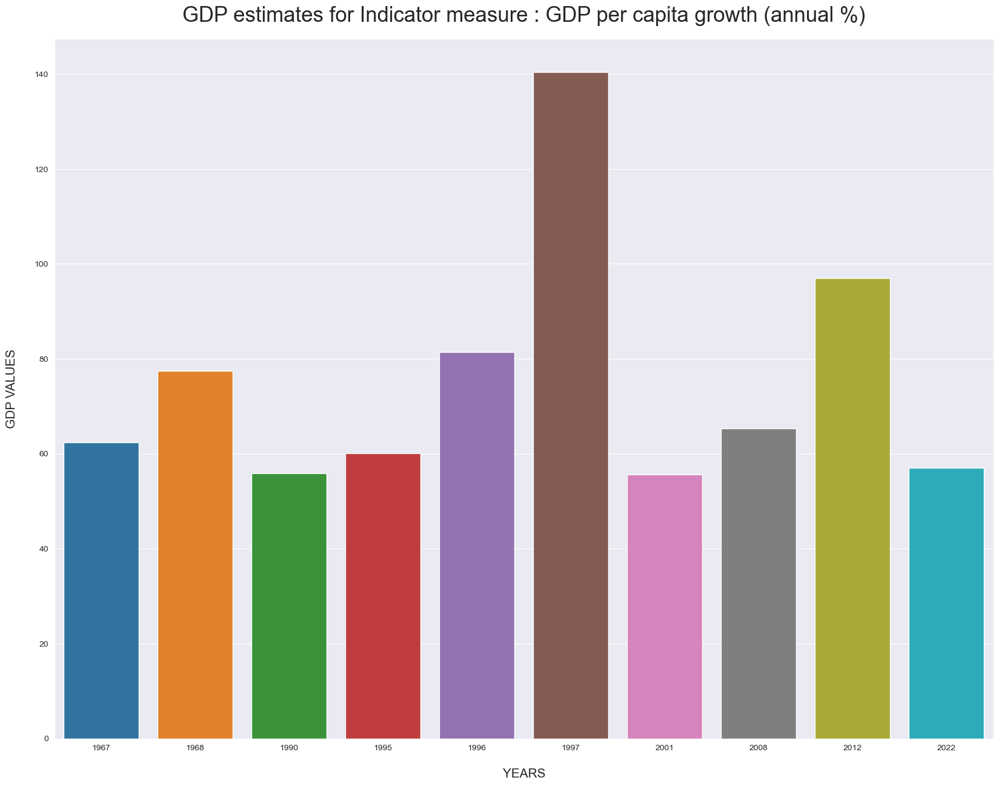

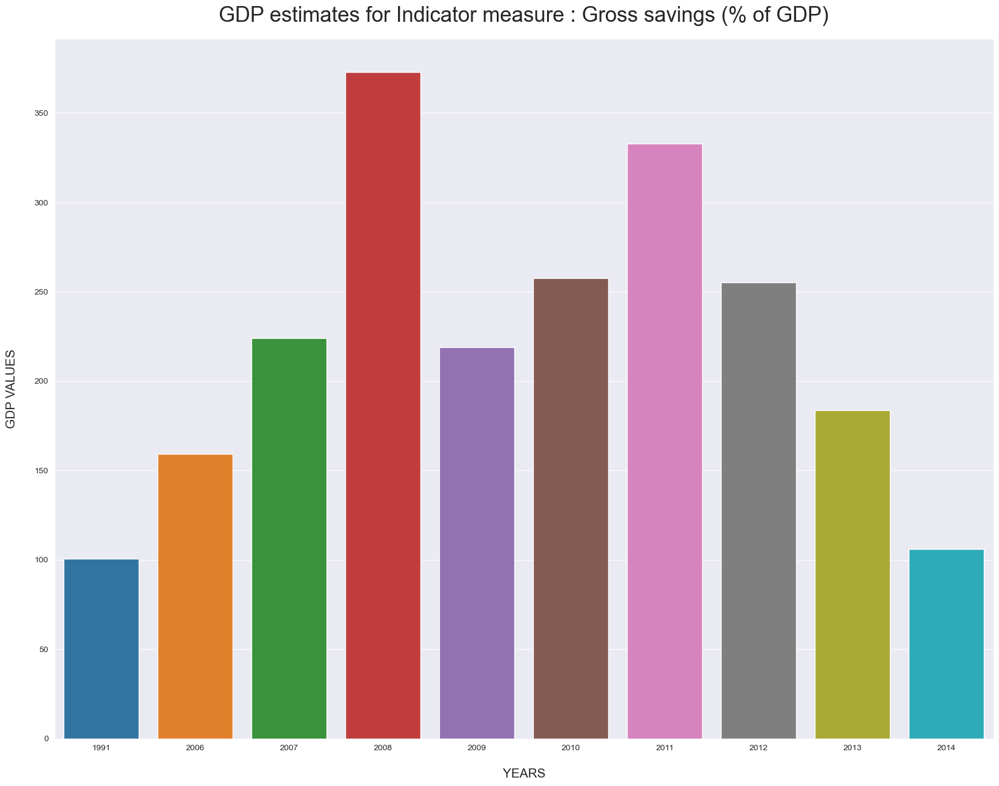

In [446]:
for i in range(1,6):
    year_wise_max_gdp = df[df['indicator_id']==i].groupby(['year_'])[['gdp_value']].max()
    year_wise_max_gdp = year_wise_max_gdp.sort_values(by=['gdp_value'],ascending=False)
    year_wise_max_gdp['year'] = year_wise_max_gdp.index
    year_wise_max_gdp = year_wise_max_gdp[0:10].sort_values(by=['year'])
    year_wise_max_gdp = year_wise_max_gdp.reset_index(drop=True)
    plt.figure(figsize=(20, 15))
    sns.barplot(data=year_wise_max_gdp,
           x='year',
           y='gdp_value')
    ind = (df_dim_indicator[df_dim_indicator['indicator_id']==i]['indicator_name']).to_string()[5:]
    plt.title(f'GDP estimates for Indicator measure : {ind}', fontsize=25, pad=20)
    plt.xlabel("YEARS", fontsize=15, labelpad=20)
    plt.ylabel("GDP VALUES", fontsize=15, labelpad=20)
    plt.show();
    

For each indicator, to 10 years (gdp based)

#### Indicator - 1

<h1 style="color:red;">Perform analysis on why there is increase at certain periods</h1>

#### Visualization using Lineplot

### Decade wise visualization

# Top 10 Average GDP

### GDP Trends Over Years

GDP trends for each region over the years

In [22]:
merged_df = pd.merge(merged_df,df_dim_time_period,left_on='year_id',right_on='time_period_id')
merged_df = merged_df.drop(columns=['time_period_id']) 

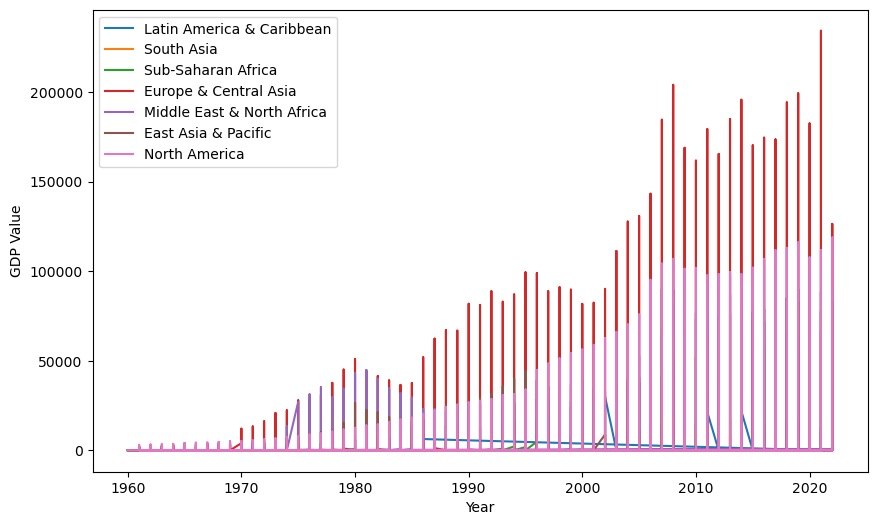

In [23]:
plt.figure(figsize=(10,6))
for region in merged_df['region_name'].unique():
    region_data = merged_df[merged_df['region_name'] == region]
    plt.plot(region_data['year_'],region_data['gdp_value'],label=region)
plt.xlabel('Year')
plt.ylabel('GDP Value')
plt.legend()
plt.show()

# Distribution of GDP by Income Group

visualization of distribution of GDP values across different income groups

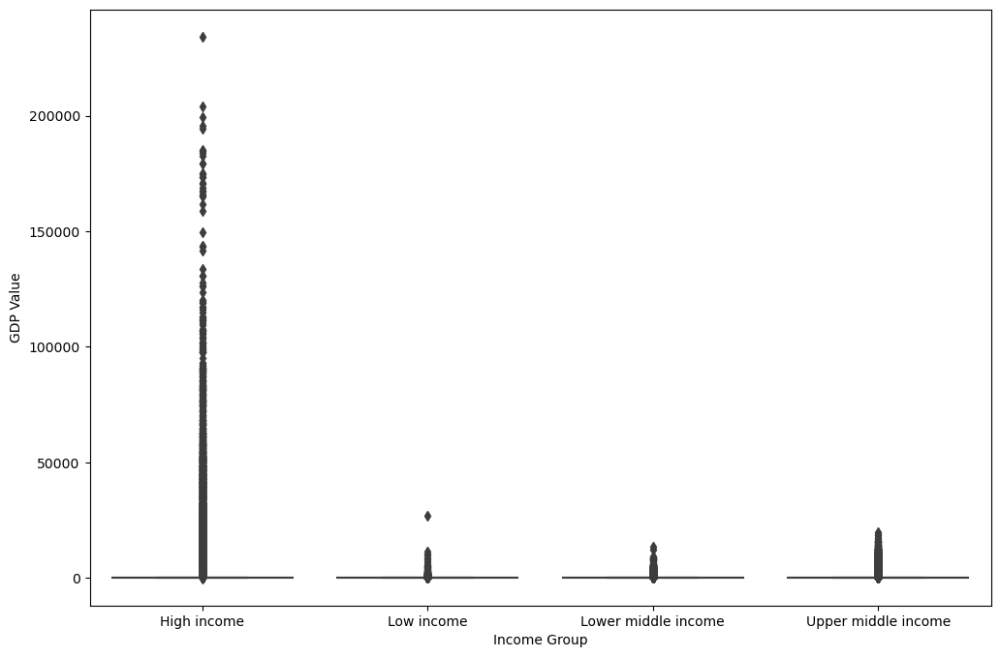

In [24]:
merged_df = pd.merge(df_fact,df_dim_income,on='income_id')
plt.figure(figsize=(12,8))
sns.boxplot(x='income_group',y='gdp_value',data=merged_df)
plt.xlabel('Income Group')
plt.ylabel('GDP Value')
plt.show()

# Time Series Analysis : GDP over the years

In [25]:
merged_df = pd.merge(df_fact,df_dim_time_period,left_on='year_id',right_on='time_period_id')
merged_df['year_'] = pd.to_datetime(merged_df['year_'],format='%Y')
merged_df.set_index('year_',inplace=True)
merged_df

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,time_period_id
year_,,,,,,,,
1987-01-01,1,1,28,3.0,1.0,1,3.591970,28
1987-01-01,62,1,28,NaN,NaN,2,11.735784,28
1987-01-01,143,1,28,NaN,NaN,4,1.684563,28
1987-01-01,185,1,28,7.0,3.0,5,9.823311,28
1987-01-01,227,1,28,2.0,4.0,6,-0.000306,28
...,...,...,...,...,...,...,...,...
1960-01-01,38365,3,1,NaN,NaN,259,4.000000,1
1960-01-01,38517,3,1,7.0,4.0,263,5.000000,1
1960-01-01,38580,3,1,7.0,3.0,264,2.000000,1


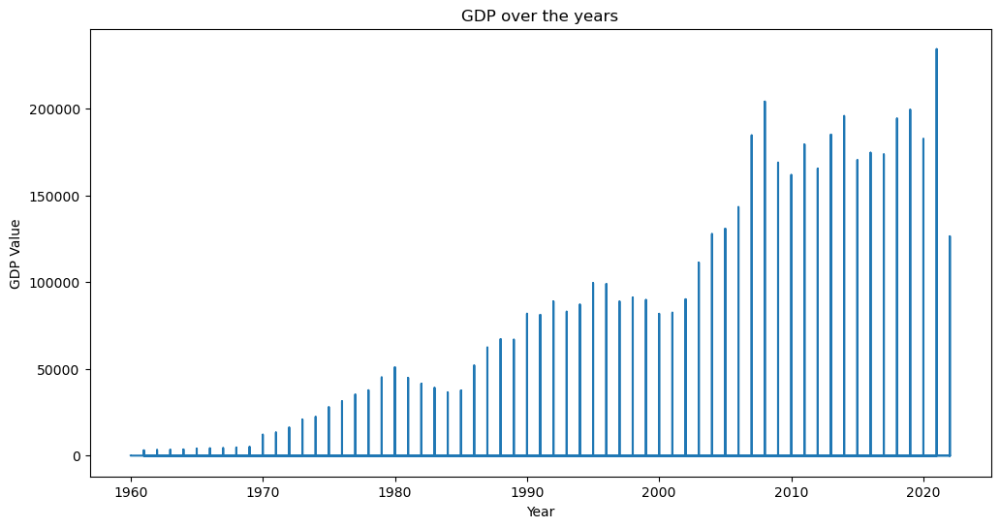

In [26]:
plt.figure(figsize=(12,6))
plt.plot(merged_df['gdp_value'])
plt.title('GDP over the years')
plt.xlabel('Year')
plt.ylabel('GDP Value')
plt.show()

<hr>

### Comparision of Country's performance for each indicator

For a given country code, a comparision of performance evaluation by each indicator over the years is given.

In [27]:
merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
merged_df = pd.merge(merged_df,df_dim_time_period,left_on='year_id',right_on='time_period_id')
merged_df = merged_df.drop(columns=['time_period_id'])
merged_df = pd.merge(merged_df,df_dim_indicator,on='indicator_id')
merged_df

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,special_notes,year_,indicator_code,indicator_name,source_note,source_organization
0,1,1,28,3.0,1.0,1,3.591970,ABW,Aruba,None,1987,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
1,62,1,28,NaN,NaN,2,11.735784,AFE,Africa Eastern and Southern,"26 countries, stretching from the Red Sea in t...",1987,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
2,143,1,28,NaN,NaN,4,1.684563,AFW,Africa Western and Central,"22 countries, stretching from the westernmost ...",1987,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
3,185,1,28,7.0,3.0,5,9.823311,AGO,Angola,The World Bank systematically assesses the app...,1987,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
4,227,1,28,2.0,4.0,6,-0.000306,ALB,Albania,None,1987,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59069,58795,5,63,2.0,3.0,252,37.504285,UZB,Uzbekistan,None,2022,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."
59070,58954,5,63,1.0,3.0,260,25.892329,WSM,Samoa,The reporting period for national accounts dat...,2022,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."
59071,58969,5,63,2.0,4.0,261,24.460047,XKX,Kosovo,None,2022,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."
59072,59032,5,63,7.0,4.0,263,14.853015,ZAF,South Africa,Fiscal year end: March 31; reporting period fo...,2022,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."


In [28]:
country_code = input('Enter the country code :')
country_df = merged_df[merged_df['country_code'] == country_code]

Enter the country code :XKX


In [29]:
country_df

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,special_notes,year_,indicator_code,indicator_name,source_note,source_organization
5365,12378,1,50,2.0,4.0,261,-2.833157,XKX,Kosovo,None,2009,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
5620,12379,1,51,2.0,4.0,261,6.392429,XKX,Kosovo,None,2010,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
5875,12380,1,52,2.0,4.0,261,6.303690,XKX,Kosovo,None,2011,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
6130,12381,1,53,2.0,4.0,261,3.525404,XKX,Kosovo,None,2012,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
6385,12382,1,54,2.0,4.0,261,0.353023,XKX,Kosovo,None,2013,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57056,58965,5,59,2.0,4.0,261,28.635588,XKX,Kosovo,None,2018,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."
57261,58966,5,60,2.0,4.0,261,28.879968,XKX,Kosovo,None,2019,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."
57460,58967,5,61,2.0,4.0,261,26.583254,XKX,Kosovo,None,2020,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."
57646,58968,5,62,2.0,4.0,261,27.220448,XKX,Kosovo,None,2021,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."


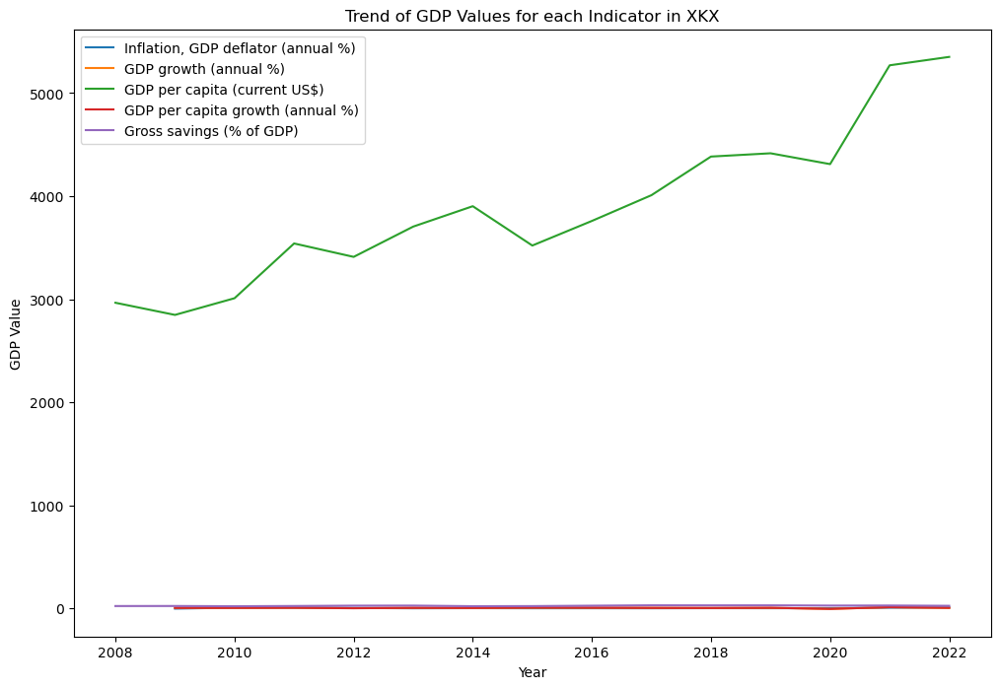

In [30]:
plt.figure(figsize=(12,8))
for indicator in country_df['indicator_name'].unique():
    indicator_data = country_df[country_df['indicator_name']==indicator]
    plt.plot(indicator_data['year_'],indicator_data['gdp_value'],label=indicator)
plt.xlabel('Year')
plt.ylabel('GDP Value')
plt.title(f'Trend of GDP Values for each Indicator in {country_code}')
plt.legend()
plt.show()

### Comparision of  GDP values of each country, in terms of indicator

In [31]:
# merged_df = pd.merge(df_fact,df_dim_country[['country_id','country_code','country_name','special_notes']],on='country_id')
# merged_df = pd.merge(merged_df,df_dim_time_period,left_on='year_id',right_on='time_period_id')
# merged_df = merged_df.drop(columns=['time_period_id'])
# merged_df = pd.merge(merged_df,df_dim_indicator,on='indicator_id')
# merged_df

In [32]:
print('List of available indicators : ')
df_dim_indicator

List of available indicators : 


,indicator_id,indicator_code,indicator_name,source_note,source_organization
0,1,NY.GDP.DEFL.KD.ZG,"Inflation, GDP deflator (annual %)",Inflation as measured by the annual growth rat...,"World Bank national accounts data, and OECD Na..."
1,2,NY.GDP.MKTP.KD.ZG,GDP growth (annual %),Annual percentage growth rate of GDP at market...,"World Bank national accounts data, and OECD Na..."
2,3,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
3,4,NY.GDP.PCAP.KD.ZG,GDP per capita growth (annual %),Annual percentage growth rate of GDP per capit...,"World Bank national accounts data, and OECD Na..."
4,5,NY.GNS.ICTR.ZS,Gross savings (% of GDP),Gross savings are calculated as gross national...,"World Bank national accounts data, and OECD Na..."


In [33]:
indicator_id = int(input('Enter the indicator id : '))
indicator_df = merged_df[merged_df['indicator_id'] == indicator_id]

Enter the indicator id : 3


In [34]:
indicator_df

,fact_id,indicator_id,year_id,region_id,income_id,country_id,gdp_value,country_code,country_name,special_notes,year_,indicator_code,indicator_name,source_note,source_organization
25336,25338,3,28,3.0,1.0,1,7567.253642,ABW,Aruba,None,1987,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
25337,25400,3,28,NaN,NaN,2,656.115225,AFE,Africa Eastern and Southern,"26 countries, stretching from the Red Sea in t...",1987,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
25338,25505,3,28,NaN,NaN,4,580.461595,AFW,Africa Western and Central,"22 countries, stretching from the westernmost ...",1987,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
25339,25548,3,28,7.0,3.0,5,755.972445,AGO,Angola,The World Bank systematically assesses the app...,1987,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
25340,25587,3,28,2.0,4.0,6,674.793383,ALB,Albania,None,1987,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38700,38209,3,1,3.0,NaN,254,9.000000,VEN,"Venezuela, RB",None,1960,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
38701,38365,3,1,NaN,NaN,259,4.000000,WLD,World,World aggregate.,1960,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
38702,38517,3,1,7.0,4.0,263,5.000000,ZAF,South Africa,Fiscal year end: March 31; reporting period fo...,1960,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."
38703,38580,3,1,7.0,3.0,264,2.000000,ZMB,Zambia,National accounts data were rebased to reflect...,1960,NY.GDP.PCAP.CD,GDP per capita (current US$),GDP per capita is gross domestic product divid...,"World Bank national accounts data, and OECD Na..."


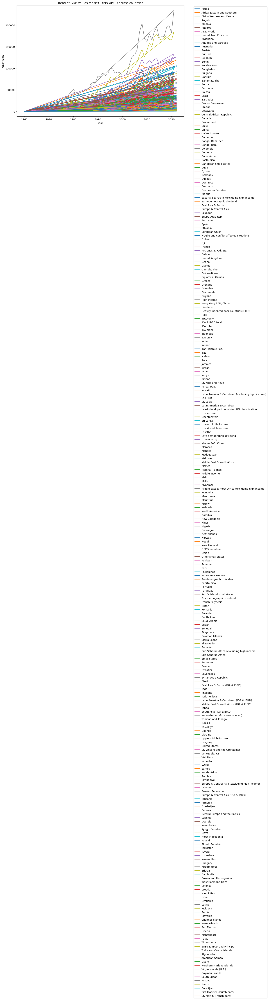

In [36]:
plt.figure(figsize=(12,8))
for country in indicator_df['country_name'].unique():
    country_data = indicator_df[indicator_df['country_name'] == country]
    plt.plot(country_data['year_'],country_data['gdp_value'],label=country)
    
ind_code = indicator_df['indicator_code'].unique()[0]
plt.xlabel('Year')
plt.ylabel('GDP Value')
plt.title(f'Trend of GDP Values for {ind_code} across countries')
plt.legend(bbox_to_anchor=(1.05,1),loc='best')
plt.show()

### Trends of each region for each indicator

A performance analysis of GDP value of all countries over the years for a given region and indicator

In [41]:
regions = list(df_dim_regions['region_name'].unique())

In [43]:
merged_df_regions = pd.merge(merged_df,df_dim_regions,on='region_id')

In [45]:
regions_df = merged_df_regions[merged_df_regions['region_name'] == regions[0]]

In [49]:
for indicator in regions_df['indicator_name'].unique():
    indicator_data = merged_df_regions[merged_df_regions['indicator_name'] == indicator]
    print(indicator)
#     for country in indicator_data['country_name'].unique():
#         country_data = indicator_data[indicator_data['country_name'] == country]
#         plt.plot(country_data['year_'],country_data['gdp_value'],label=f'{country} - {indicator}')

Inflation, GDP deflator (annual %)
GDP growth (annual %)
GDP per capita (current US$)
GDP per capita growth (annual %)
Gross savings (% of GDP)


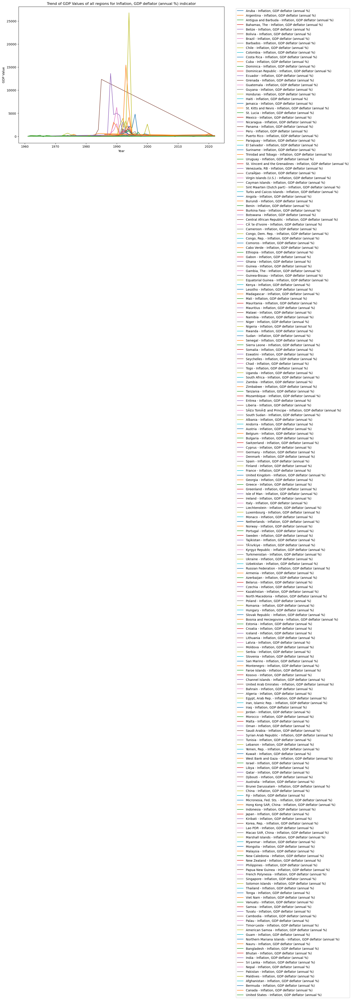

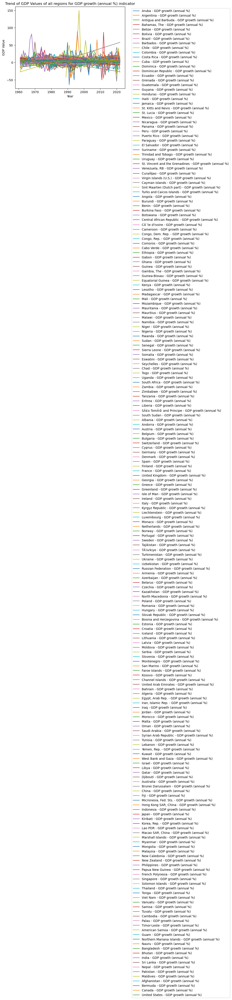

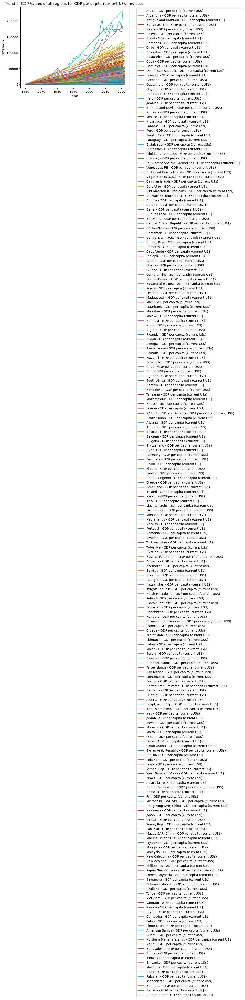

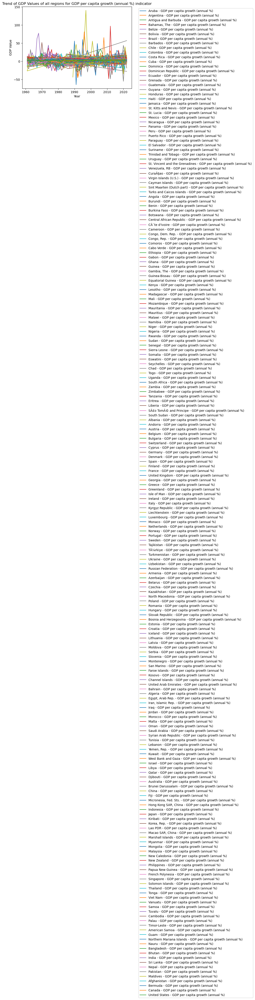

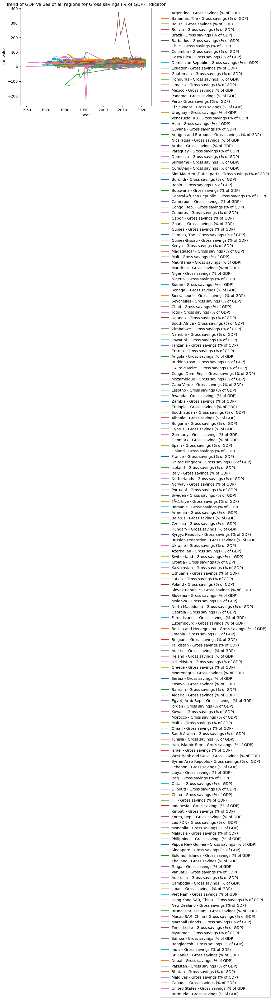

In [53]:
plt.figure(figsize=(12,8))
for indicator in regions_df['indicator_name'].unique():
    indicator_data = merged_df_regions[merged_df_regions['indicator_name'] == indicator]
    for country in indicator_data['country_name'].unique():
        country_data = indicator_data[indicator_data['country_name'] == country]
        plt.plot(country_data['year_'],country_data['gdp_value'],label=f'{country} - {indicator}')
    plt.xlabel('Year')
    plt.ylabel('GDP Value')
    plt.title(f'Trend of GDP Values of all regions for {indicator} indicator')
    plt.legend(bbox_to_anchor=(1.05,1))
    plt.show()

### Overall gdp performance of each country

### Performance of each country over the years

### Top Countries with highest GDP per capita

https://muskanjindal242.medium.com/gdp-analysis-using-countries-of-the-world-dataset-with-python-a8b45fec0d44

#### Extract countries and their corresponding maximum gdp

In [23]:
#for indicator_id = 1, each country_id and corresponding highest gdp value
#df_fact[df_fact['indicator_id']==1].groupby('country_id').gdp_value.max() #series datatype

countries_max_gdp_df = df_fact[df_fact['indicator_id']==1].groupby('country_id').gdp_value.max().to_frame() #dataframe datatype
#adding country id as a column
countries_max_gdp_df['country_id'] = countries_max_gdp_df.index
countries_max_gdp_df
# type(df_fact[df_fact['indicator_id']==1].groupby('country_id').gdp_value.max())

,gdp_value,country_id
country_id,,
1,6.592951,1
2,22.026565,2
3,22.527756,3
4,25.062044,4
5,4800.531644,5
...,...,...
261,8.710799,261
262,46.476251,262
263,23.046166,263


In [24]:
type(df_fact[df_fact['indicator_id']==1].groupby('country_id').gdp_value.max())

pandas.core.series.Series

#### Top 10 countries with maximum gdp over the time period of 1960 to 2022

In [25]:
#sort the dataframe in descending order
countries_max_gdp_df.sort_values(by=['gdp_value'], ascending=False)

,gdp_value,country_id
country_id,,
44,26765.858250,44
83,15444.384250,83
175,13611.634820,175
29,12338.660220,29
186,6261.239559,186
...,...,...
1,6.592951,1
94,5.064408,94
39,4.397719,39


### Comparing GDPs of two countries

### Country wise 

### Best year output of each country based on GDP

### Time series analyis

------------------

# GDP Prediction

-  Nominal GDP estimates are commonly used to determine the economic performance of a whole country of region, and to make international comparisions.

- GDP has large impact on people living in that economy. It affects their lifestyle, health, and also on the stock market. Study of different articles on GDP has led us to identify some of the factors affecting GDP such as natural income, net exports, gross savings and salaries of the people, Government expenditure and investment and the personal income.

- It is important to analyze the effect of the above mentioned factors on the GDP so as to predict the future performance of the economy and to take necessary measures to prevent a crisis in the future.

- For this analysis, we have imported the United States quarterly GDP data from quandl.

- Likewise, the columns have been taken from quandl according to their importance to the GDP. 

- With this data, we'll forecast the factors affecting the GDP and will predict the GDP based on the forecasted factors. 

- For this we are using the ARIMA method for forecasting and Multivariate regression for predicting the future GDP.

# Comparision pre-post covid, during
# percentage fall

### FUTURE

- How different increase in certain income groups affects the average gdp values overtime
